# Ross Sea synthetic gravity inversion

import packages

In [1]:
from __future__ import annotations

%load_ext autoreload
%autoreload 2

import copy
import logging
import os
import pathlib
import pickle
import string

import numpy as np
import pandas as pd
import scipy as sp
import verde as vd
import xarray as xr
from polartoolkit import maps, profiles
from polartoolkit import utils as polar_utils

import RIS_gravity_inversion.gravity_processing as gravity_processing
import RIS_gravity_inversion.plotting as RIS_plotting
import RIS_gravity_inversion.synthetic as RIS_synth

os.environ["POLARTOOLKIT_HEMISPHERE"] = "south"

logging.getLogger().setLevel(logging.INFO)

from invert4geom import (
    inversion,
    optimization,
    plotting,
    regional,
    synthetic,
    uncertainty,
    utils,
)

# Get synthetic model data

INFO:root:converting to be reference to the WGS84 ellipsoid


INFO:root:spacing larger than original, filtering and resampling
grdsample [WARNING]: Output sampling interval in x exceeds input interval and may lead to aliasing.
grdsample [WARNING]: Output sampling interval in y exceeds input interval and may lead to aliasing.


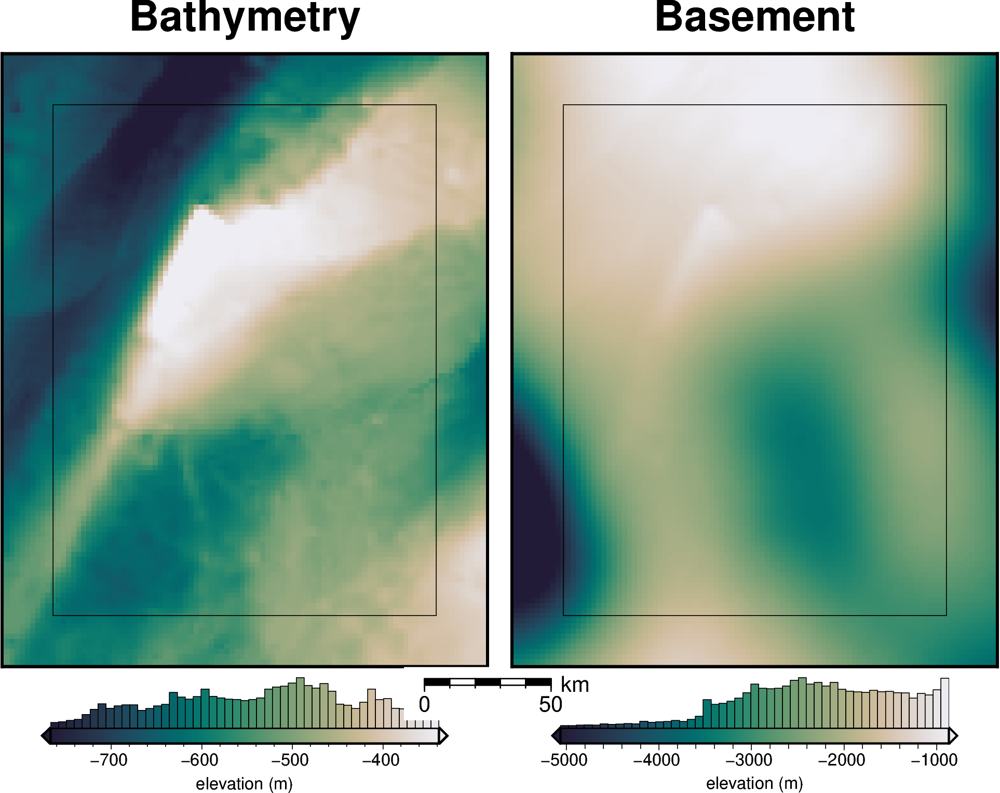

  0%|          | 0/7676 [00:00<?, ?it/s]

  0%|          | 0/7676 [00:00<?, ?it/s]

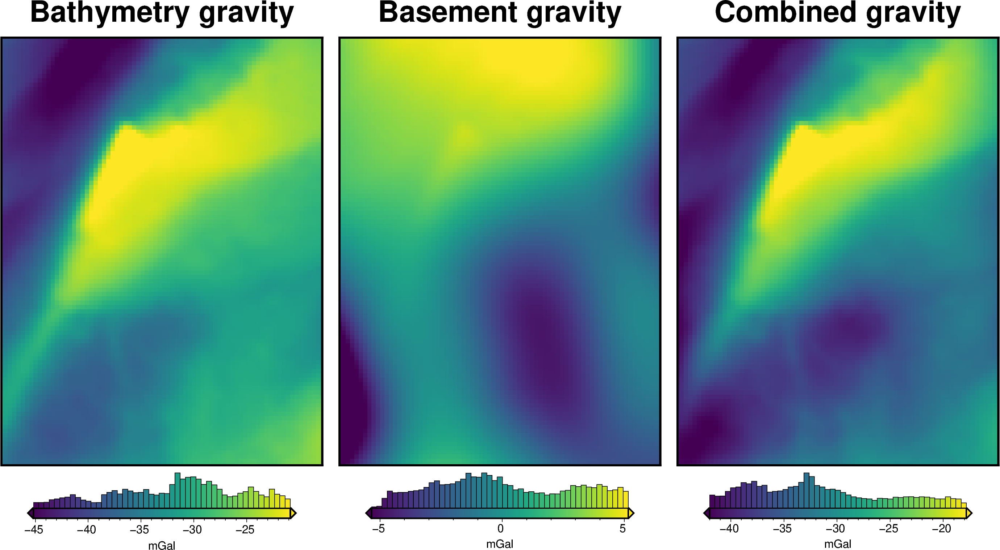

,northing,easting,upward,bathymetry_grav,basement_grav,disturbance,gravity_anomaly
0,-1600000.0,-40000.0,1000.0,-35.551041,-5.840619,-41.391660,-41.391660
1,-1600000.0,-38000.0,1000.0,-36.054652,-5.461833,-41.516485,-41.516485
2,-1600000.0,-36000.0,1000.0,-36.473148,-5.050636,-41.523784,-41.523784
3,-1600000.0,-34000.0,1000.0,-36.755612,-4.613992,-41.369604,-41.369604
4,-1600000.0,-32000.0,1000.0,-36.951032,-4.158981,-41.110014,-41.110014


In [2]:
# set grid parameters
spacing = 2e3
inversion_region = (-40e3, 110e3, -1600e3, -1400e3)

true_density_contrast = 1476

bathymetry, basement, grav_df = RIS_synth.load_synthetic_model(
    spacing=spacing,
    inversion_region=inversion_region,
    buffer=spacing * 10,
    basement=True,
    zref=0,
    bathymetry_density_contrast=true_density_contrast,
)
buffer_region = polar_utils.get_grid_info(bathymetry)[1]
grav_df.head()

In [3]:
reg = grav_df.basement_grav
reg -= reg.mean()
utils.rmse(reg)

np.float64(2.9623803566760274)

In [4]:
# normalize regional gravity between -1 and 1
grav_df["basement_grav_normalized"] = (
    vd.grid_to_table(
        utils.normalize_xarray(
            grav_df.set_index(["northing", "easting"]).to_xarray().basement_grav,
            low=-1,
            high=1,
        )
    )
    .reset_index()
    .basement_grav
)
grav_df = grav_df.drop(columns=["basement_grav", "disturbance", "gravity_anomaly"])

In [5]:
# re-scale the regional gravity
regional_grav = utils.normalize_xarray(
    grav_df.set_index(["northing", "easting"]).to_xarray().basement_grav_normalized,
    low=0,
    high=50,
).rename("basement_grav")
regional_grav -= regional_grav.mean()

# add to dataframe
grav_df["basement_grav"] = vd.grid_to_table(regional_grav).reset_index().basement_grav

# add basement and bathymetry forward gravities together to make observed gravity
grav_df["gravity_anomaly_full_res_no_noise"] = (
    grav_df.bathymetry_grav + grav_df.basement_grav
)

# add long-wavelength noise to the gravity anomaly
gravity_noise = 0.5
grav_df["gravity_anomaly_full_res"] = grav_df.gravity_anomaly_full_res_no_noise
cont = synthetic.contaminate_with_long_wavelength_noise(
    grav_df.set_index(["northing", "easting"])
    .to_xarray()
    .gravity_anomaly_full_res_no_noise,
    coarsen_factor=None,
    spacing=20e3,
    noise_as_percent=False,
    noise=gravity_noise,
)
df = vd.grid_to_table(cont.rename("gravity_anomaly_full_res")).reset_index(drop=True)
grav_df = pd.merge(  # noqa: PD015
    grav_df.drop(columns=["gravity_anomaly_full_res"], errors="ignore"),
    df,
    on=["easting", "northing"],
)

# short-wavelength noise
cont = synthetic.contaminate_with_long_wavelength_noise(
    grav_df.set_index(["northing", "easting"]).to_xarray().gravity_anomaly_full_res,
    coarsen_factor=None,
    spacing=spacing * 2,
    noise_as_percent=False,
    noise=gravity_noise,
)
df = vd.grid_to_table(cont.rename("gravity_anomaly_full_res")).reset_index(drop=True)
grav_df = pd.merge(  # noqa: PD015
    grav_df.drop(columns=["gravity_anomaly_full_res"], errors="ignore"),
    df,
    on=["easting", "northing"],
)
grav_df["uncert"] = gravity_noise

new_reg = grav_df.set_index(["northing", "easting"]).to_xarray().basement_grav
new_reg -= new_reg.mean()
print(utils.rmse(new_reg))

grav_df

INFO:invert4geom:Standard deviation used for noise: [0.5]
INFO:invert4geom:Standard deviation used for noise: [0.5]


10.22829728593871


,northing,easting,upward,bathymetry_grav,basement_grav_normalized,basement_grav,gravity_anomaly_full_res_no_noise,gravity_anomaly_full_res,uncert
0,-1600000.0,-40000.0,1000.0,-35.551041,-0.576200,-20.166076,-55.717117,-56.108610,0.5
1,-1600000.0,-38000.0,1000.0,-36.054652,-0.523887,-18.858229,-54.912881,-55.483439,0.5
2,-1600000.0,-36000.0,1000.0,-36.473148,-0.467097,-17.438478,-53.911626,-54.600484,0.5
3,-1600000.0,-34000.0,1000.0,-36.755612,-0.406792,-15.930867,-52.686479,-53.347323,0.5
4,-1600000.0,-32000.0,1000.0,-36.951032,-0.343951,-14.359836,-51.310869,-51.806348,0.5
...,...,...,...,...,...,...,...,...,...
7671,-1400000.0,102000.0,1000.0,-25.760380,0.399106,4.216576,-21.543804,-21.067825,0.5
7672,-1400000.0,104000.0,1000.0,-25.911731,0.334770,2.608194,-23.303537,-22.622355,0.5
7673,-1400000.0,106000.0,1000.0,-26.033127,0.268772,0.958236,-25.074891,-24.272173,0.5
7674,-1400000.0,108000.0,1000.0,-26.122232,0.201841,-0.715051,-26.837283,-26.099743,0.5


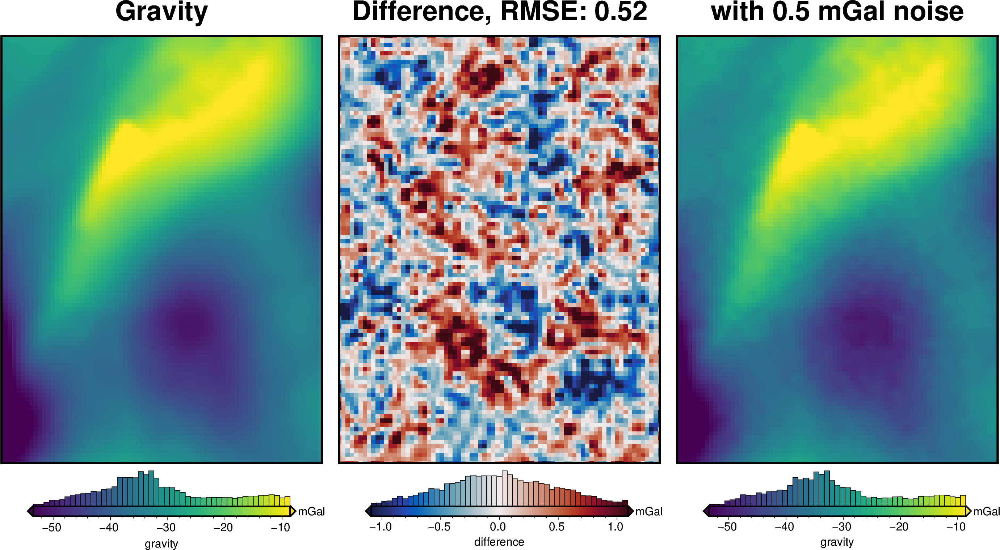

In [6]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

_ = polar_utils.grd_compare(
    grav_grid.gravity_anomaly_full_res_no_noise,
    grav_grid.gravity_anomaly_full_res,
    fig_height=10,
    plot=True,
    plot_type="pygmt",
    grid1_name="Gravity",
    grid2_name=f"with {gravity_noise} mGal noise",
    title="Difference",
    title_font="18p,Helvetica-Bold,black",
    cbar_unit="mGal",
    cbar_label="gravity",
    # RMSE_decimals=0,
    robust=True,
    region=inversion_region,
    inset=False,
    hist=True,
    cbar_yoffset=1,
    label_font="16p,Helvetica,black",
)

## Create synthetic airborne survey

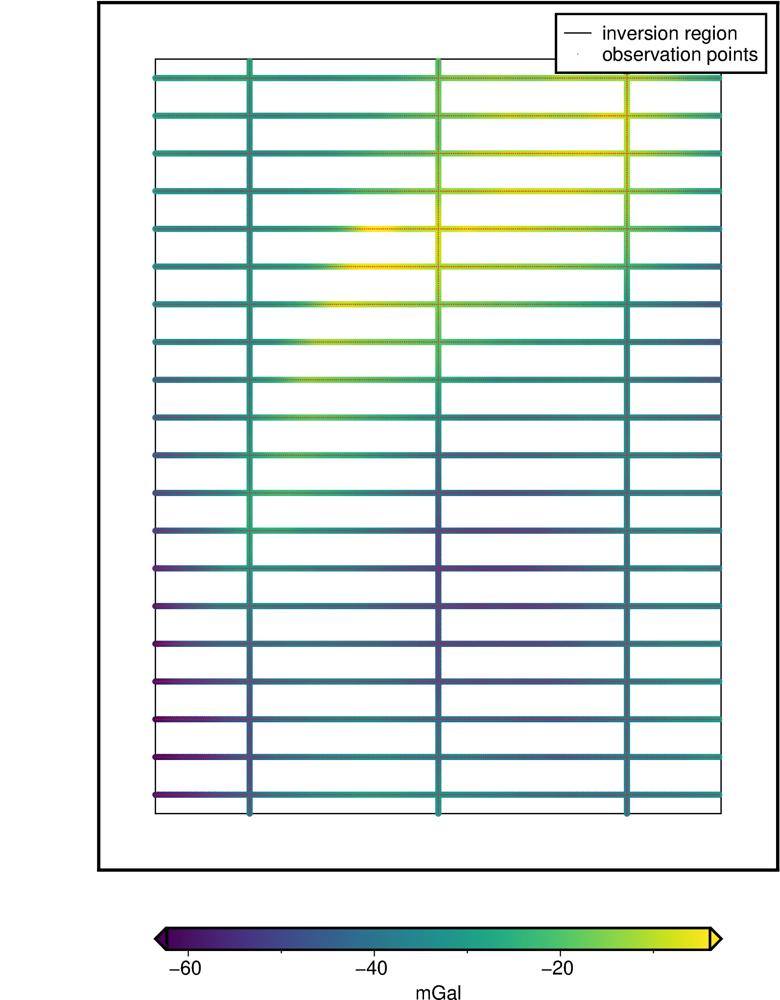

,northing,easting,upward,line,time,geometry,dist_along_line,gravity_anomaly
0,-1600000.0,-15000.0,1000.0,1000.0,0.0,POINT (-15000.000 -1600000.000),0.0,-38.959320
1,-1600000.0,35000.0,1000.0,1010.0,0.0,POINT (35000.000 -1600000.000),0.0,-31.103120
2,-1600000.0,85000.0,1000.0,1020.0,0.0,POINT (85000.000 -1600000.000),0.0,-36.787842
3,-1599500.0,-15000.0,1000.0,1000.0,1.0,POINT (-15000.000 -1599500.000),500.0,-39.313314
4,-1599500.0,35000.0,1000.0,1010.0,1.0,POINT (35000.000 -1599500.000),500.0,-31.181796
...,...,...,...,...,...,...,...,...
5995,-1405000.0,107500.0,1000.0,29.0,295.0,POINT (107500.000 -1405000.000),147500.0,-25.761309
5996,-1405000.0,108000.0,1000.0,29.0,296.0,POINT (108000.000 -1405000.000),148000.0,-26.228323
5997,-1405000.0,108500.0,1000.0,29.0,297.0,POINT (108500.000 -1405000.000),148500.0,-26.700420
5998,-1405000.0,109000.0,1000.0,29.0,298.0,POINT (109000.000 -1405000.000),149000.0,-27.188697


In [7]:
grav_survey_df = RIS_synth.airborne_survey(
    along_line_spacing=500,
    grav_observation_height=1e3,
    NS_line_spacing=50e3,
    EW_line_spacing=10e3,
    region=inversion_region,
    grav_grid=grav_df.set_index(
        ["northing", "easting"]
    ).gravity_anomaly_full_res.to_xarray(),
    plot=True,
)
grav_survey_df

In [8]:
grav_survey_df = profiles.sample_grids(
    grav_survey_df,
    grav_df.set_index(
        ["northing", "easting"]
    ).gravity_anomaly_full_res_no_noise.to_xarray(),
    sampled_name="gravity_anomaly_no_noise",
)
grav_survey_df

,northing,easting,upward,line,time,geometry,dist_along_line,gravity_anomaly,gravity_anomaly_no_noise
0,-1600000.0,-15000.0,1000.0,1000.0,0.0,POINT (-15000.000 -1600000.000),0.0,-38.959320,-38.653400
1,-1600000.0,35000.0,1000.0,1010.0,0.0,POINT (35000.000 -1600000.000),0.0,-31.103120,-30.737997
2,-1600000.0,85000.0,1000.0,1020.0,0.0,POINT (85000.000 -1600000.000),0.0,-36.787842,-37.093268
3,-1599500.0,-15000.0,1000.0,1000.0,1.0,POINT (-15000.000 -1599500.000),500.0,-39.313314,-38.977210
4,-1599500.0,35000.0,1000.0,1010.0,1.0,POINT (35000.000 -1599500.000),500.0,-31.181796,-30.932035
...,...,...,...,...,...,...,...,...,...
5995,-1405000.0,107500.0,1000.0,29.0,295.0,POINT (107500.000 -1405000.000),147500.0,-25.761309,-26.154721
5996,-1405000.0,108000.0,1000.0,29.0,296.0,POINT (108000.000 -1405000.000),148000.0,-26.228323,-26.597584
5997,-1405000.0,108500.0,1000.0,29.0,297.0,POINT (108500.000 -1405000.000),148500.0,-26.700420,-27.036461
5998,-1405000.0,109000.0,1000.0,29.0,298.0,POINT (109000.000 -1405000.000),149000.0,-27.188697,-27.471776


In [9]:
gravity_processing.plotly_profiles(
    grav_survey_df[grav_survey_df.line == 1000],
    x="dist_along_line",
    y=("gravity_anomaly", "gravity_anomaly_no_noise"),
    title="Gravity anomaly profiles",
    # y_axes=None,
    # xlims=None,
    # ylims=None,
)

In [10]:
# grid the airborne survey data over the whole grid
coords = (grav_survey_df.easting, grav_survey_df.northing, grav_survey_df.upward)
data = grav_survey_df.gravity_anomaly

eq_study, eqs = optimization.optimize_eq_source_params(
    coords,
    data,
    n_trials=12,
    damping_limits=(1e-3, 10),
    depth_limits=(100, 100e3),
    # damping=None,
    # depth="default",
    block_size=spacing,
    plot=True,
    fname="../../results/Ross_Sea_07_eq_sources",
)

INFO:invert4geom:using 8 startup trials


  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

INFO:invert4geom:Trial with best score: 
INFO:invert4geom:	trial number: 7
INFO:invert4geom:	parameter: {'depth': 9414.437721470877, 'damping': 0.5023336514396778}
INFO:invert4geom:	scores: [0.9995874021599732]


In [11]:
# predict sources onto grid
grav_df["eqs_gravity_anomaly"] = eqs.predict(
    (
        grav_df.easting,
        grav_df.northing,
        grav_df.upward,  # either grav_df.upward or user-set constant value
    ),
)

grav_df["gravity_anomaly"] = grav_df.eqs_gravity_anomaly
grav_df

,northing,easting,upward,bathymetry_grav,basement_grav_normalized,basement_grav,gravity_anomaly_full_res_no_noise,gravity_anomaly_full_res,uncert,eqs_gravity_anomaly,gravity_anomaly
0,-1600000.0,-40000.0,1000.0,-35.551041,-0.576200,-20.166076,-55.717117,-56.108610,0.5,-51.642166,-51.642166
1,-1600000.0,-38000.0,1000.0,-36.054652,-0.523887,-18.858229,-54.912881,-55.483439,0.5,-51.808887,-51.808887
2,-1600000.0,-36000.0,1000.0,-36.473148,-0.467097,-17.438478,-53.911626,-54.600484,0.5,-51.379621,-51.379621
3,-1600000.0,-34000.0,1000.0,-36.755612,-0.406792,-15.930867,-52.686479,-53.347323,0.5,-50.574836,-50.574836
4,-1600000.0,-32000.0,1000.0,-36.951032,-0.343951,-14.359836,-51.310869,-51.806348,0.5,-49.577791,-49.577791
...,...,...,...,...,...,...,...,...,...,...,...
7671,-1400000.0,102000.0,1000.0,-25.760380,0.399106,4.216576,-21.543804,-21.067825,0.5,-20.722669,-20.722669
7672,-1400000.0,104000.0,1000.0,-25.911731,0.334770,2.608194,-23.303537,-22.622355,0.5,-22.061789,-22.061789
7673,-1400000.0,106000.0,1000.0,-26.033127,0.268772,0.958236,-25.074891,-24.272173,0.5,-23.193245,-23.193245
7674,-1400000.0,108000.0,1000.0,-26.122232,0.201841,-0.715051,-26.837283,-26.099743,0.5,-24.003795,-24.003795


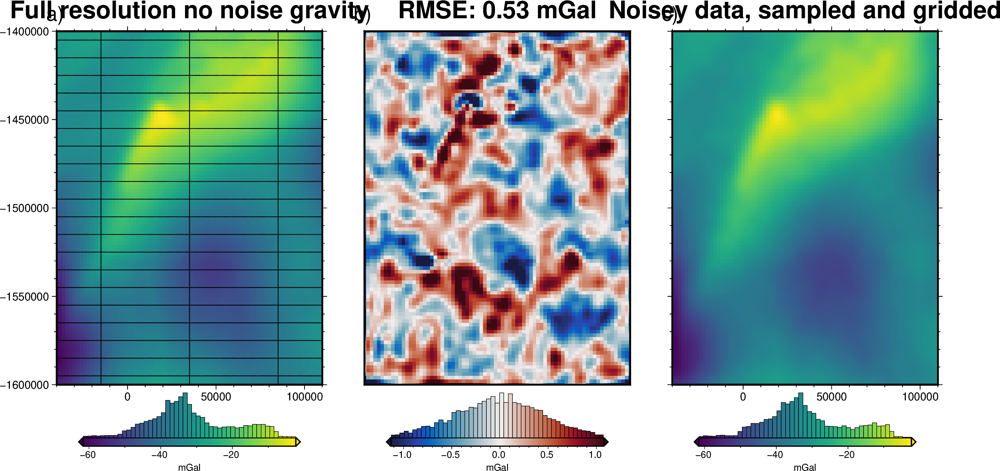

In [12]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

# plot the synthetic gravity anomaly grid
lims = polar_utils.get_min_max(grav_grid.gravity_anomaly_full_res_no_noise)

fig = maps.plot_grd(
    grav_grid.gravity_anomaly_full_res_no_noise,
    fig_height=10,
    cmap="viridis",
    cpt_lims=lims,
    title="Full resolution no noise gravity",
    cbar_label="mGal",
    frame=["nSWe", "xaf10000", "yaf10000"],
    hist=True,
)
# plot observation points
fig.plot(
    grav_survey_df[["easting", "northing"]],
    style="c.02c",
    fill="black",
)
fig.text(
    position="TL",
    justify="BL",
    text="a)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)

dif = grav_grid.gravity_anomaly_full_res_no_noise - grav_grid.gravity_anomaly
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="balance+h0",
    robust=True,
    title=f"RMSE: {round(utils.rmse(dif),2)} mGal",
    cbar_label="mGal",
    hist=True,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.1,
)
fig.text(
    position="TL",
    justify="BL",
    text="b)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)

# plot the synthetic observed gravity grid
fig = maps.plot_grd(
    grav_grid.gravity_anomaly,
    fig_height=10,
    cmap="viridis",
    cpt_lims=lims,
    title="Noisey data, sampled and gridded",
    cbar_label="mGal",
    frame=["nSwe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.1,
)
fig.text(
    position="TL",
    justify="BL",
    text="c)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)
fig.show()

# Make starting bathymetry model

In [13]:
# semi-regularly spaced
constraint_points = RIS_synth.constraint_layout_number(
    shape=(4, 5),
    region=inversion_region,
    padding=-spacing,
    shapefile="../../data/Ross_Sea_outline.shp",
    add_outside_points=True,
    grid_spacing=spacing,
)

# sample true topography at these points
constraint_points = utils.sample_grids(
    constraint_points,
    bathymetry,
    "true_upward",
    coord_names=("easting", "northing"),
)
constraint_points["upward"] = constraint_points.true_upward

# re-sample depths with uncertainty to emulate measurement errors
# set each points uncertainty equal to 5% of depth
uncert = np.where(
    constraint_points.inside == True, np.abs(0.05 * constraint_points.upward), 0
)
constraint_points.loc[constraint_points.index, "true_uncert"] = uncert

# make uncert for outside points 0
# constraint_points.loc[constraint_points.inside==False, "true_uncert"] = 0

constraint_points = uncertainty.randomly_sample_data(
    seed=0,
    data_df=constraint_points,
    data_col="upward",
    uncert_col="true_uncert",
)

# create weights column
# constraint_points["weight"] = 1 / (constraint_points.true_uncert**2)

# create estimated uncertainty column
uncert = np.where(
    constraint_points.inside == True, np.abs(0.05 * constraint_points.upward), 0
)
constraint_points.loc[constraint_points.index, "uncert"] = uncert

constraint_points.describe()

,northing,easting,true_upward,upward,true_uncert,uncert
count,8.640000e+02,864.000000,864.000000,864.000000,864.000000,864.000000
mean,-1.500000e+06,35000.000000,-555.730565,-555.622104,0.592406,0.586983
std,7.996291e+04,62837.916165,110.176891,110.551895,3.945790,3.934578
min,-1.600000e+06,-40000.000000,-834.579163,-834.579163,0.000000,0.000000
25%,-1.590000e+06,-36000.000000,-653.745163,-654.132172,0.000000,0.000000
50%,-1.500000e+06,35000.000000,-550.741394,-550.239105,0.000000,0.000000
75%,-1.410000e+06,106000.000000,-455.580765,-455.001720,0.000000,0.000000
max,-1.400000e+06,110000.000000,-298.322685,-297.712133,37.902128,39.498484


In [14]:
# grid the sampled values using verde
starting_topography_kwargs = dict(
    method="splines",
    region=buffer_region,
    spacing=spacing,
    constraints_df=constraint_points,
    dampings=None,
)

starting_bathymetry = utils.create_topography(**starting_topography_kwargs)

starting_bathymetry

<xarray.DataArray 'scalars' (northing: 121, easting: 96)> Size: 93kB
array([[-540.65869159, -544.0383323 , -547.43837032, ..., -359.49861364,
        -356.54482596, -353.65321194],
       [-542.78384311, -546.31007865, -549.89622732, ..., -362.44793504,
        -359.49095341, -356.61129353],
       [-544.51827718, -548.17840472, -551.94504163, ..., -365.25108846,
        -362.29744037, -359.43834405],
       ...,
       [-592.34965156, -595.90403926, -599.44312411, ..., -440.93153138,
        -440.71941703, -440.41602479],
       [-590.96233702, -594.51356006, -598.05588324, ..., -440.74937826,
        -440.46942548, -440.10156107],
       [-589.63504628, -593.19844229, -596.76083705, ..., -440.59622392,
        -440.23609732, -439.79425898]])
Coordinates:
  * easting   (easting) float64 768B -6e+04 -5.8e+04 ... 1.28e+05 1.3e+05
  * northing  (northing) float64 968B -1.62e+06 -1.618e+06 ... -1.38e+06
Attributes:
    metadata:  Generated by SplineCV(cv=KFold(n_splits=5, random_state=0, shu...
    damping:   None

In [15]:
# sample the inverted topography at the constraint points
constraint_points = utils.sample_grids(
    constraint_points,
    starting_bathymetry,
    "starting_bathymetry",
    coord_names=("easting", "northing"),
)

rmse = utils.rmse(constraint_points.true_upward - constraint_points.starting_bathymetry)
print(f"RMSE: {rmse:.2f} m")

RMSE: 3.80 m


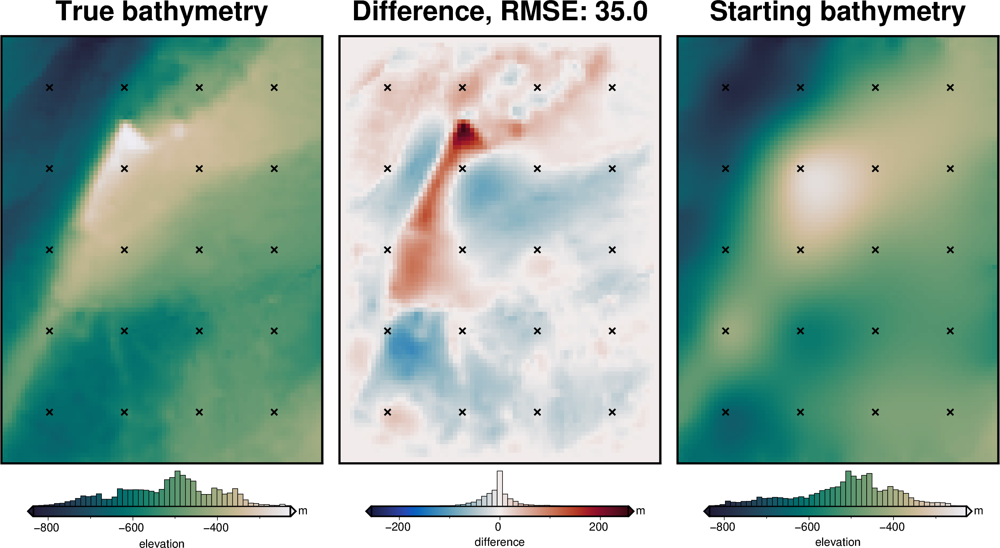

In [16]:
# compare starting and actual bathymetry grids
grids = polar_utils.grd_compare(
    bathymetry,
    starting_bathymetry,
    fig_height=10,
    plot=True,
    plot_type="pygmt",
    cmap="rain",
    reverse_cpt=True,
    diff_cmap="balance+h0",
    grid1_name="True bathymetry",
    grid2_name="Starting bathymetry",
    title="Difference",
    title_font="18p,Helvetica-Bold,black",
    cbar_unit="m",
    cbar_label="elevation",
    RMSE_decimals=0,
    region=inversion_region,
    inset=False,
    hist=True,
    cbar_yoffset=1,
    label_font="16p,Helvetica,black",
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)

In [17]:
# the true density contrast is 1476 kg/m3
density_contrast = 1350

# set the reference level from the prisms to 0
zref = 0

density_grid = xr.where(
    starting_bathymetry >= zref,
    density_contrast,
    -density_contrast,
)

# create layer of prisms
starting_prisms = utils.grids_to_prisms(
    starting_bathymetry,
    zref,
    density=density_grid,
)

grav_df["starting_gravity"] = starting_prisms.prism_layer.gravity(
    coordinates=(
        grav_df.easting,
        grav_df.northing,
        grav_df.upward,
    ),
    field="g_z",
    progressbar=True,
)

grav_df

  0%|          | 0/7676 [00:00<?, ?it/s]

,northing,easting,upward,bathymetry_grav,basement_grav_normalized,basement_grav,gravity_anomaly_full_res_no_noise,gravity_anomaly_full_res,uncert,eqs_gravity_anomaly,gravity_anomaly,starting_gravity
0,-1600000.0,-40000.0,1000.0,-35.551041,-0.576200,-20.166076,-55.717117,-56.108610,0.5,-51.642166,-51.642166,-32.532210
1,-1600000.0,-38000.0,1000.0,-36.054652,-0.523887,-18.858229,-54.912881,-55.483439,0.5,-51.808887,-51.808887,-32.956515
2,-1600000.0,-36000.0,1000.0,-36.473148,-0.467097,-17.438478,-53.911626,-54.600484,0.5,-51.379621,-51.379621,-33.337993
3,-1600000.0,-34000.0,1000.0,-36.755612,-0.406792,-15.930867,-52.686479,-53.347323,0.5,-50.574836,-50.574836,-33.634416
4,-1600000.0,-32000.0,1000.0,-36.951032,-0.343951,-14.359836,-51.310869,-51.806348,0.5,-49.577791,-49.577791,-33.829521
...,...,...,...,...,...,...,...,...,...,...,...,...
7671,-1400000.0,102000.0,1000.0,-25.760380,0.399106,4.216576,-21.543804,-21.067825,0.5,-20.722669,-20.722669,-23.325388
7672,-1400000.0,104000.0,1000.0,-25.911731,0.334770,2.608194,-23.303537,-22.622355,0.5,-22.061789,-22.061789,-23.485504
7673,-1400000.0,106000.0,1000.0,-26.033127,0.268772,0.958236,-25.074891,-24.272173,0.5,-23.193245,-23.193245,-23.608551
7674,-1400000.0,108000.0,1000.0,-26.122232,0.201841,-0.715051,-26.837283,-26.099743,0.5,-24.003795,-24.003795,-23.695724


## Regional misfit

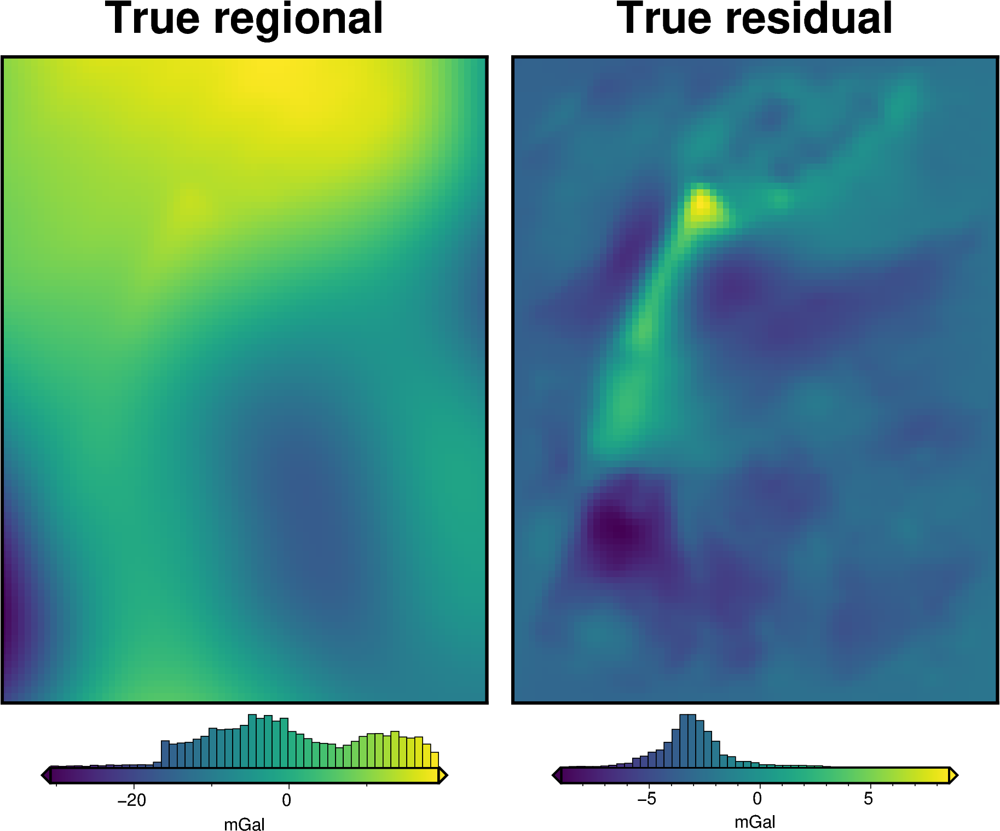

In [18]:
# calculate the true residual misfit
grav_df["true_res"] = grav_df.bathymetry_grav - grav_df.starting_gravity

# grid the results
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

fig = maps.plot_grd(
    grav_grid.basement_grav,
    fig_height=10,
    title="True regional",
    hist=True,
    cbar_yoffset=1,
    cbar_label="mGal",
)

fig = maps.plot_grd(
    grav_grid.true_res,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="True residual",
    hist=True,
    cbar_yoffset=1,
    cbar_label="mGal",
)

fig.show()

In [19]:
def regional_comparison(df):
    # grid the results
    grav_grid = df.set_index(["northing", "easting"]).to_xarray()

    # calculate the true residual and regional misfit
    grav_grid["true_res"] = grav_grid.bathymetry_grav - grav_grid.starting_gravity
    # grav_grid["true_reg"] = grav_grid.gravity_anomaly - grav_grid.bathymetry_grav
    grav_grid["true_reg"] = grav_grid.basement_grav

    # compare with true regional
    _ = polar_utils.grd_compare(
        grav_grid.true_reg,
        grav_grid.reg,
        plot=True,
        grid1_name="True regional misfit",
        grid2_name="Regional misfit",
        hist=True,
        cbar_yoffset=1,
        inset=False,
        verbose="q",
        title="difference",
        grounding_line=False,
        points=constraint_points,
        points_style="x.3c",
    )
    # compare with true residual
    _ = polar_utils.grd_compare(
        grav_grid.true_res,
        grav_grid.res,
        plot=True,
        grid1_name="True residual misfit",
        grid2_name="Residual misfit",
        cmap="balance+h0",
        hist=True,
        cbar_yoffset=1,
        inset=False,
        verbose="q",
        title="difference",
        grounding_line=False,
        points=constraint_points,
        points_style="x.3c",
    )

In [20]:
# estimate regional with the constraints
regional_grav_kwargs = dict(
    method="constraints",
    grid_method="eq_sources",
    constraints_df=constraint_points,
    cv=True,
    cv_kwargs=dict(
        n_trials=20,
        # damping_limits=(1e-30, 10),
        depth_limits=(100, 500e3),
        progressbar=False,
        fname="../../tmp_outputs/Ross_Sea_07_regional_sep",
    ),
    # constraints_weights_column="weight",
    block_size=None,
    damping=None,
)

INFO:invert4geom:using 5 startup trials


  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

INFO:invert4geom:Trial with best score: 
INFO:invert4geom:	trial number: 15
INFO:invert4geom:	parameter: {'depth': 298830.40068812895}
INFO:invert4geom:	scores: [0.9988572124257192]


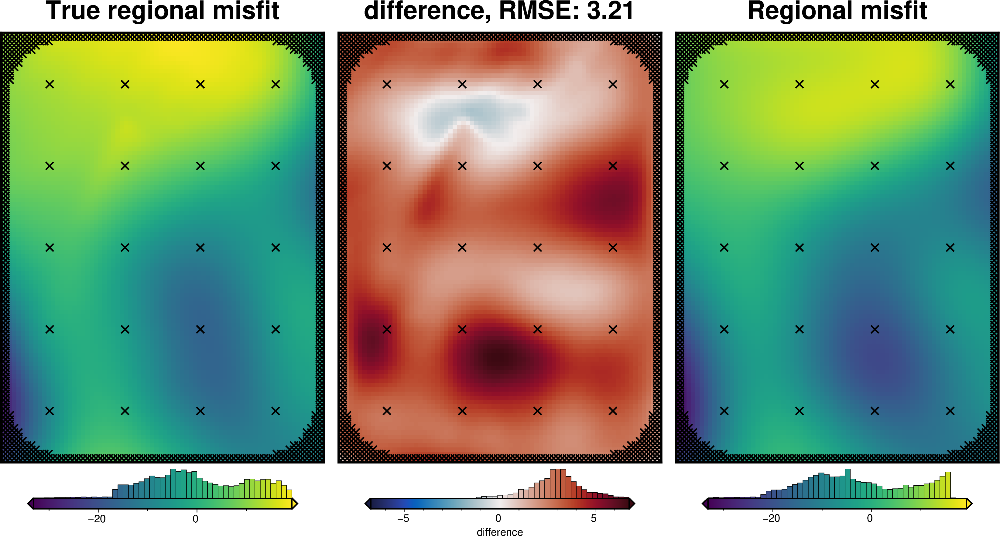

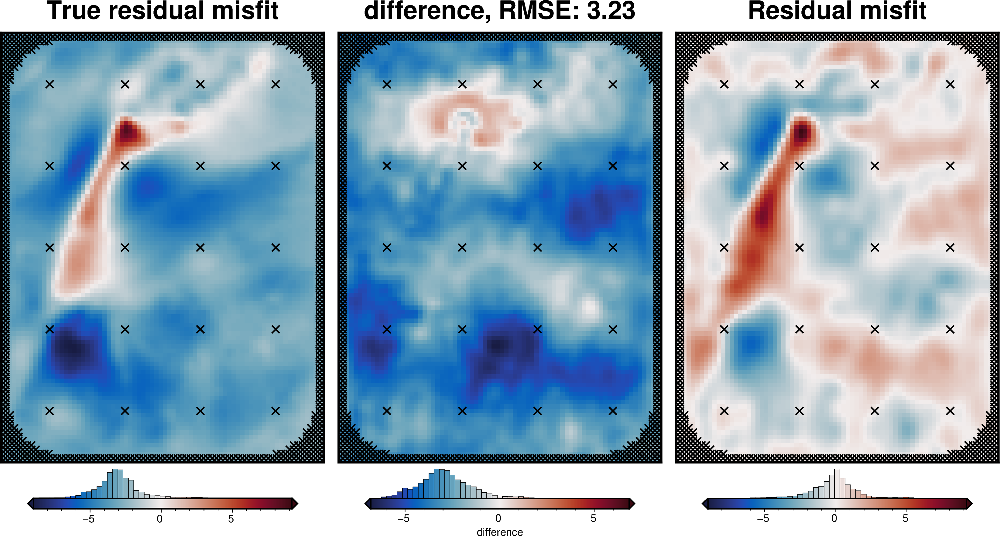

,northing,easting,upward,bathymetry_grav,basement_grav_normalized,basement_grav,gravity_anomaly_full_res_no_noise,gravity_anomaly_full_res,uncert,eqs_gravity_anomaly,gravity_anomaly,starting_gravity,true_res,misfit,reg,res
count,7.676000e+03,7676.000000,7676.0,7676.000000,7676.000000,7.676000e+03,7676.000000,7676.000000,7676.0,7676.000000,7676.000000,7676.000000,7676.000000,7676.000000,7676.000000,7676.000000
mean,-1.500000e+06,35000.000000,1000.0,-31.727297,0.230443,-6.161246e-15,-31.727297,-31.725415,0.5,-31.711536,-31.711536,-28.695332,-3.031965,-3.016204,-2.906524,-0.109680
std,5.831332e+04,43877.680138,0.0,6.458138,0.409159,1.022896e+01,11.377662,11.359710,0.0,11.330293,11.330293,5.950925,1.759612,10.830532,10.874123,1.679924
min,-1.600000e+06,-40000.000000,1000.0,-48.457766,-1.000000,-3.076107e+01,-61.620274,-63.150489,0.5,-61.316184,-61.316184,-44.573853,-8.976462,-33.168249,-33.141834,-6.047049
25%,-1.550000e+06,-2500.000000,1000.0,-36.286368,-0.074669,-7.627788e+00,-38.893491,-38.956035,0.5,-38.959291,-38.959291,-31.983149,-3.894680,-11.099586,-11.052675,-0.923535
50%,-1.500000e+06,35000.000000,1000.0,-31.030073,0.181261,-1.229549e+00,-33.466093,-33.425160,0.5,-33.374501,-33.374501,-27.978162,-3.127826,-5.154521,-4.567820,-0.046873
75%,-1.450000e+06,72500.000000,1000.0,-27.279068,0.595978,9.138373e+00,-24.669594,-24.819320,0.5,-24.720347,-24.720347,-24.772596,-2.324836,6.452523,6.714392,0.640604
max,-1.400000e+06,110000.000000,1000.0,-16.585801,1.000000,1.923893e+01,-2.336353,-2.777293,0.5,-2.660811,-2.660811,-15.785581,8.537943,23.025700,16.067775,9.179560


In [21]:
temp_reg_kwargs = copy.deepcopy(regional_grav_kwargs)

# temporarily set some kwargs
temp_reg_kwargs["cv_kwargs"]["plot"] = True
temp_reg_kwargs["cv_kwargs"]["progressbar"] = True

grav_df = regional.regional_separation(
    grav_df=grav_df,
    **temp_reg_kwargs,
)

regional_comparison(grav_df)
grav_df.describe()

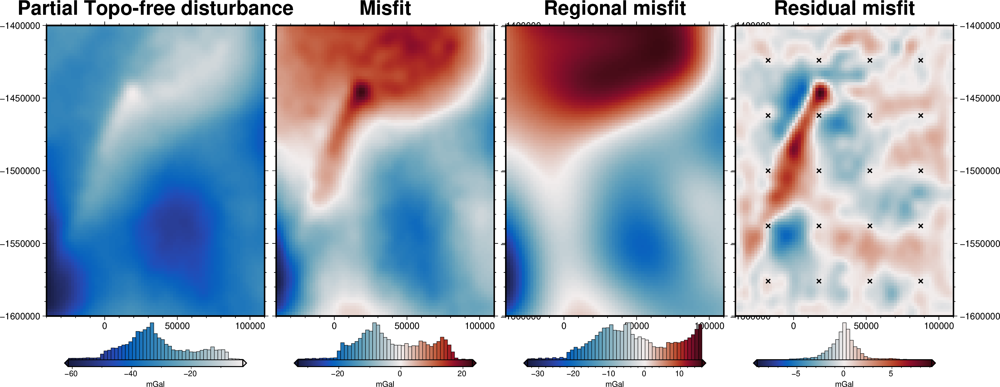

In [22]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

fig = maps.plot_grd(
    grav_grid.gravity_anomaly,
    region=inversion_region,
    fig_height=10,
    title="Partial Topo-free disturbance",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSWe", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.misfit,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Misfit",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.reg,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Regional misfit",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.res,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Residual misfit",
    cmap="balance+h0",
    cpt_lims=[-vd.maxabs(grav_grid.res), vd.maxabs(grav_grid.res)],
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)
fig.show()

In [23]:
grav_df.uncert.mean()

np.float64(0.5)

In [24]:
# set kwargs to pass to the inversion
kwargs = {
    # set stopping criteria
    "max_iterations": 200,
    "l2_norm_tolerance": grav_df.uncert.mean()
    ** 0.5,  # square root of the gravity noise
    "delta_l2_norm_tolerance": 1.008,
}

# Damping Cross Validation

In [25]:
logging.getLogger().setLevel(logging.INFO)

# run the inversion workflow, including a cross validation for the damping parameter
results = inversion.run_inversion_workflow(
    grav_df=grav_df,
    starting_prisms=starting_prisms,
    # for creating test/train splits
    grav_spacing=spacing,
    inversion_region=inversion_region,
    run_damping_cv=True,
    damping_limits=(0.001, 0.1),
    damping_cv_trials=8,
    # plot_cv=True,
    fname="../../results/Ross_Sea_07_damping_cv",
    **kwargs,
)

INFO:invert4geom:saving all results with root name '../../results/Ross_Sea_07_damping_cv'


INFO:invert4geom:running damping cross validation
INFO:invert4geom:using 4 startup trials


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

INFO:invert4geom:Trial with best score: 
INFO:invert4geom:	trial number: 7
INFO:invert4geom:	parameter: {'damping': 0.014429709791178436}
INFO:invert4geom:	scores: [0.01522895098096794]
INFO:invert4geom:results saved to ../../results/Ross_Sea_07_damping_cv_results.pickle.pickle


In [26]:
# load saved inversion results
with pathlib.Path("../../results/Ross_Sea_07_damping_cv_results.pickle").open(
    "rb"
) as f:
    results = pickle.load(f)

# load study
with pathlib.Path("../../results/Ross_Sea_07_damping_cv_damping_cv_study.pickle").open(
    "rb"
) as f:
    study = pickle.load(f)

# collect the results
topo_results, grav_results, parameters, elapsed_time = results

In [27]:
best_damping = parameters.get("Solver damping")
kwargs["solver_damping"] = best_damping
best_damping

0.014429709791178436

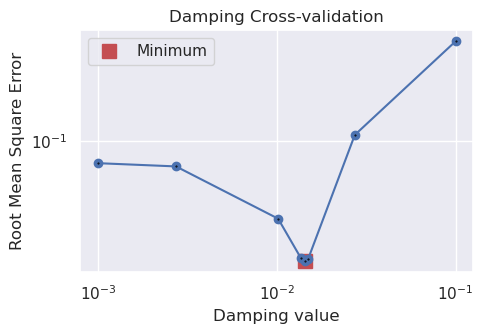

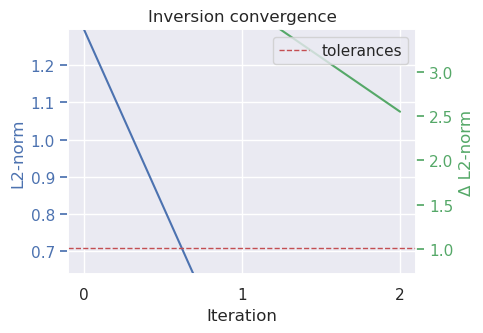

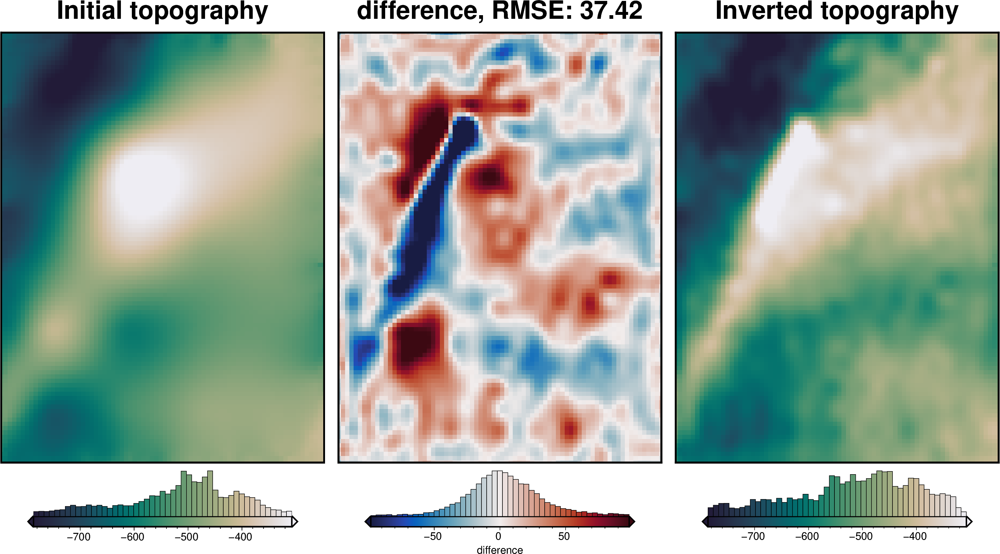

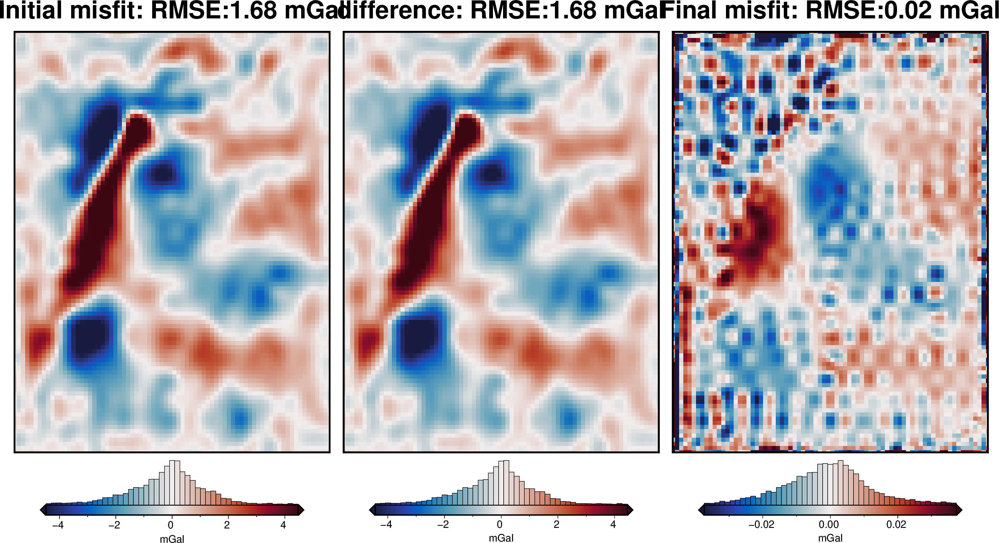

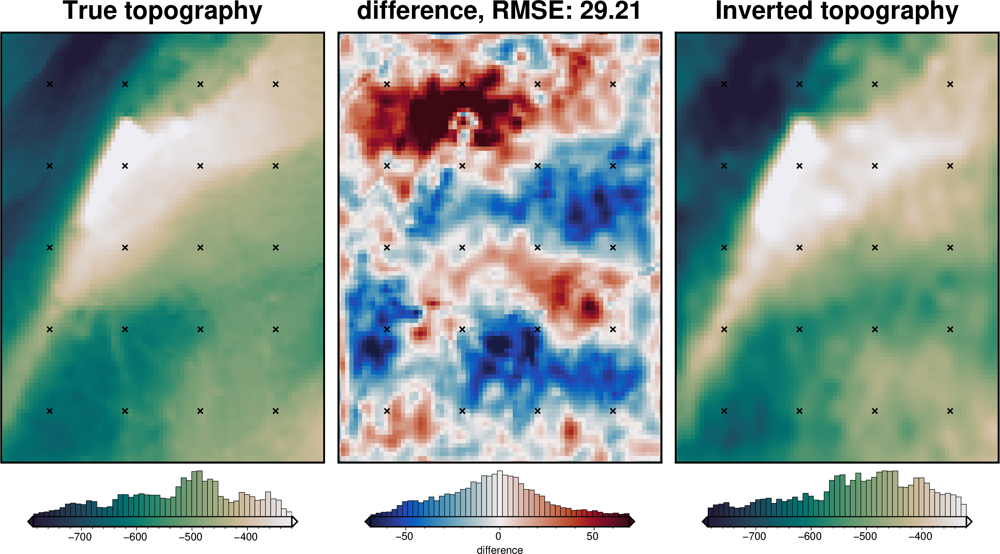

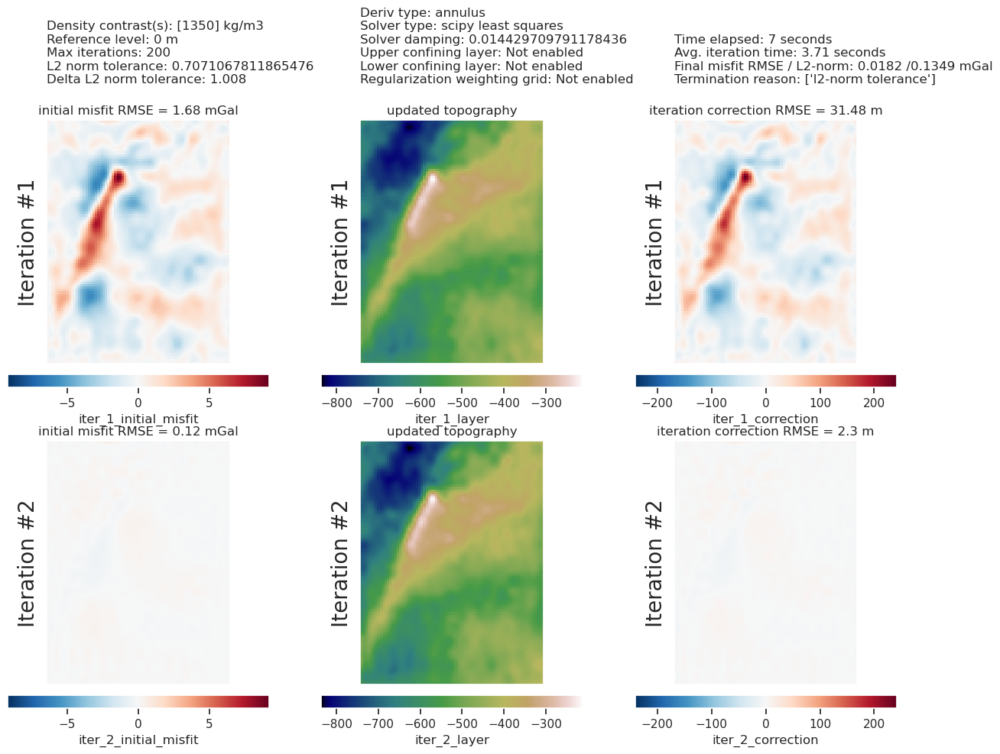

In [28]:
study_df = study.trials_dataframe()

plotting.plot_cv_scores(
    study_df.value,
    study_df.params_damping,
    param_name="Damping",
    logx=True,
    logy=True,
)

plotting.plot_convergence(
    grav_results,
    params=parameters,
)

plotting.plot_inversion_results(
    grav_results,
    topo_results,
    parameters,
    inversion_region,
    iters_to_plot=2,
    plot_iter_results=True,
    plot_topo_results=True,
    plot_grav_results=True,
)

final_topography = topo_results.set_index(["northing", "easting"]).to_xarray().topo

_ = polar_utils.grd_compare(
    bathymetry,
    final_topography,
    region=inversion_region,
    plot=True,
    grid1_name="True topography",
    grid2_name="Inverted topography",
    robust=True,
    hist=True,
    inset=False,
    verbose="q",
    title="difference",
    grounding_line=False,
    reverse_cpt=True,
    cmap="rain",
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)

In [29]:
# sample the inverted topography at the constraint points
constraint_points = utils.sample_grids(
    constraint_points,
    final_topography,
    "inverted_topography",
    coord_names=("easting", "northing"),
)

rmse = utils.rmse(constraint_points.true_upward - constraint_points.inverted_topography)
print(f"RMSE: {rmse:.2f} m")

RMSE: 12.42 m


# Density CV

INFO:invert4geom:using 4 startup trials


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

INFO:invert4geom:Trial with best score: 
INFO:invert4geom:	trial number: 1
INFO:invert4geom:	parameter: {'density_contrast': 1600}
INFO:invert4geom:	scores: [250.36585635472252]


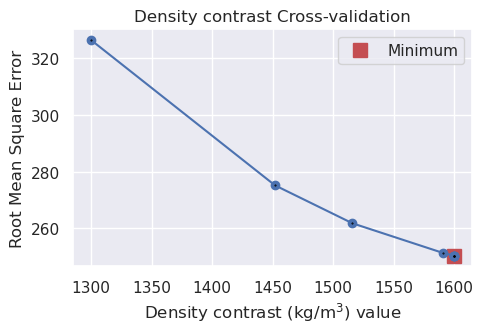

In [30]:
# run the cross validation for density
study, inversion_results = optimization.optimize_inversion_zref_density_contrast(
    grav_df=grav_df,
    constraints_df=constraint_points,  # [constraint_points.inside],
    density_contrast_limits=(1300, 1600),
    zref=0,
    n_trials=8,
    starting_topography=starting_bathymetry,
    regional_grav_kwargs=dict(
        method="constant",
        constant=0,
    ),
    fname="../../results/Ross_Sea_07_density_cv",
    **kwargs,
)

INFO:invert4geom:Constraints split into 4 folds
INFO:invert4geom:using 4 startup trials


  0%|          | 0/4 [00:00<?, ?it/s]

INFO:invert4geom:starting_topography not provided, creating a starting topography model with the supplied starting_topography_kwargs


  0%|          | 0/8 [00:00<?, ?it/s]

INFO:invert4geom:starting_topography not provided, creating a starting topography model with the supplied starting_topography_kwargs
INFO:invert4geom:Trial with best score: 
INFO:invert4geom:	trial number: 11
INFO:invert4geom:	parameter: {'density_contrast': 1451}
INFO:invert4geom:	scores: [78.13724919989956]


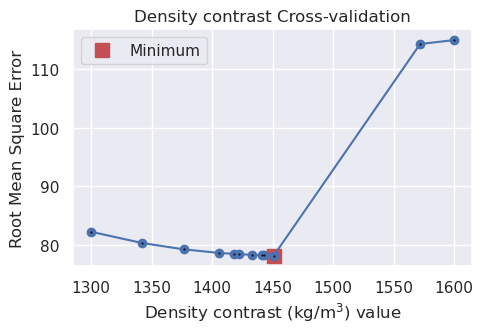

In [30]:
# run a 5-fold cross validation for 10 parameter sets of density
# this performs 50 regional separations and 50 inversions
study, inversion_results = optimization.optimize_inversion_zref_density_contrast_kfolds(
    grav_df=grav_df,
    constraints_df=constraint_points[constraint_points.inside],
    density_contrast_limits=(1300, 1600),
    zref=0,
    n_trials=12,
    # n_startup_trials=6,
    split_kwargs=dict(
        n_splits=4,
        method="KFold",
    ),
    seed=2,
    regional_grav_kwargs=regional_grav_kwargs,
    starting_topography_kwargs=starting_topography_kwargs,
    fname="../../results/Ross_Sea_07_density_cv_kfolds",
    fold_progressbar=False,
    **kwargs,
)

In [31]:
# load study from normal optimization
with pathlib.Path("../../results/Ross_Sea_07_density_cv_study.pickle").open("rb") as f:
    study = pickle.load(f)
    optimized_density = study.best_params["density_contrast"]

# load study from kfold optimization
with pathlib.Path("../../results/Ross_Sea_07_density_cv_kfolds_study.pickle").open(
    "rb"
) as f:
    study = pickle.load(f)
    kfold_optimized_density = study.best_params["density_contrast"]

print("optimal density contrast from normal optimization: ", optimized_density)
print("optimal density contrast from K-folds optimization: ", kfold_optimized_density)
print("real density contrast", true_density_contrast)

best_density_contrast = min(
    [optimized_density, kfold_optimized_density],
    key=lambda x: abs(x - true_density_contrast),
)

optimal density contrast from normal optimization:  1600
optimal density contrast from K-folds optimization:  1451
real density contrast 1476


In [32]:
print("optimal determined density contrast", best_density_contrast)
print("real density contrast", true_density_contrast)
print("density error", best_density_contrast - true_density_contrast)

optimal determined density contrast 1451
real density contrast 1476
density error -25


### Redo with optimal density contrast
During the density cross-validation to avoid biasing the scores, we had to manually set a regional field. Now, with the optimal density contrast value found, we can rerun the inversion with an automatically determined regional field strength (the average value misfit at the constraints).

In [ ]:
density_contrast = best_density_contrast

density_grid = xr.where(
    starting_bathymetry >= zref,
    density_contrast,
    -density_contrast,
)
# create layer of prisms
starting_prisms = utils.grids_to_prisms(
    starting_bathymetry,
    zref,
    density=density_grid,
)
grav_df["starting_gravity"] = starting_prisms.prism_layer.gravity(
    coordinates=(
        grav_df.easting,
        grav_df.northing,
        grav_df.upward,
    ),
    field="g_z",
    progressbar=True,
)

grav_df = regional.regional_separation(
    grav_df=grav_df,
    **regional_grav_kwargs,
)

regional_comparison(grav_df)

  0%|          | 0/7676 [00:00<?, ?it/s]

INFO:invert4geom:using 5 startup trials


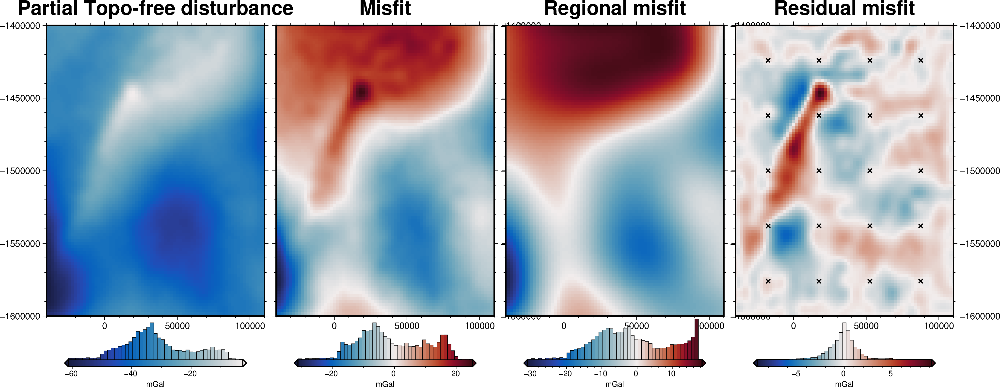

In [33]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

fig = maps.plot_grd(
    grav_grid.gravity_anomaly,
    region=inversion_region,
    fig_height=10,
    title="Partial Topo-free disturbance",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSWe", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.misfit,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Misfit",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.reg,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Regional misfit",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.res,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Residual misfit",
    cmap="balance+h0",
    cpt_lims=[-vd.maxabs(grav_grid.res), vd.maxabs(grav_grid.res)],
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)
fig.show()

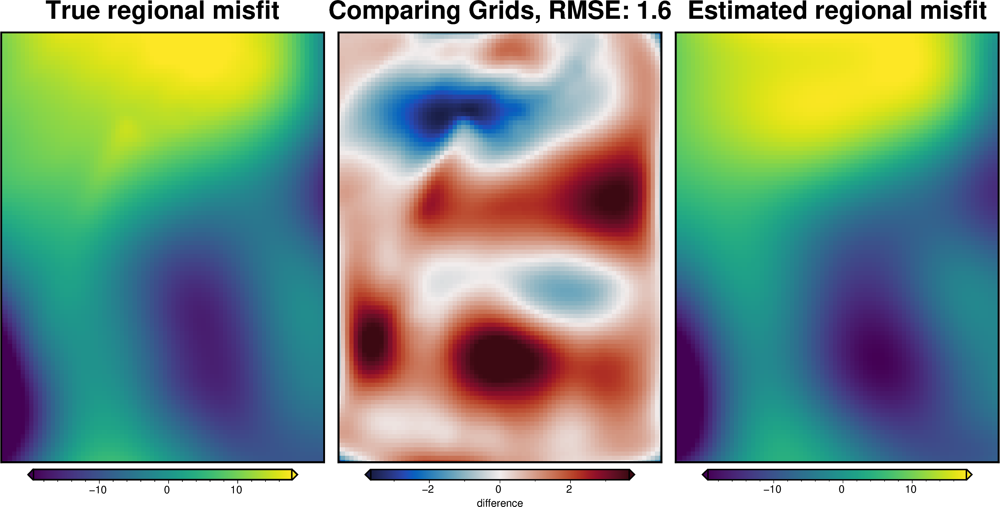

In [34]:
_ = polar_utils.grd_compare(
    grav_grid.basement_grav,
    grav_grid.reg,
    plot=True,
    inset=False,
    robust=True,
    grid1_name="True regional misfit",
    grid2_name="Estimated regional misfit",
)

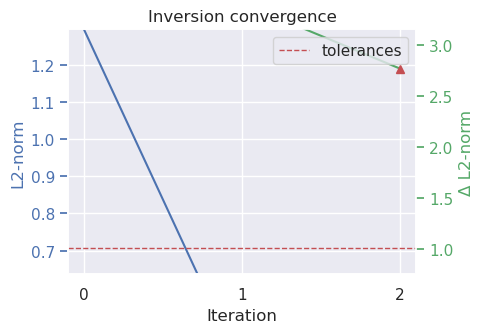

In [38]:
# run the inversion workflow
inversion_results = inversion.run_inversion_workflow(
    grav_df=grav_df,
    fname="../../results/Ross_Sea_07_optimal",
    starting_prisms=starting_prisms,
    plot_dynamic_convergence=True,
    **kwargs,
)

In [35]:
# load saved inversion results
with pathlib.Path("../../results/Ross_Sea_07_optimal_results.pickle").open("rb") as f:
    results = pickle.load(f)

# collect the results
topo_results, grav_results, parameters, elapsed_time = results

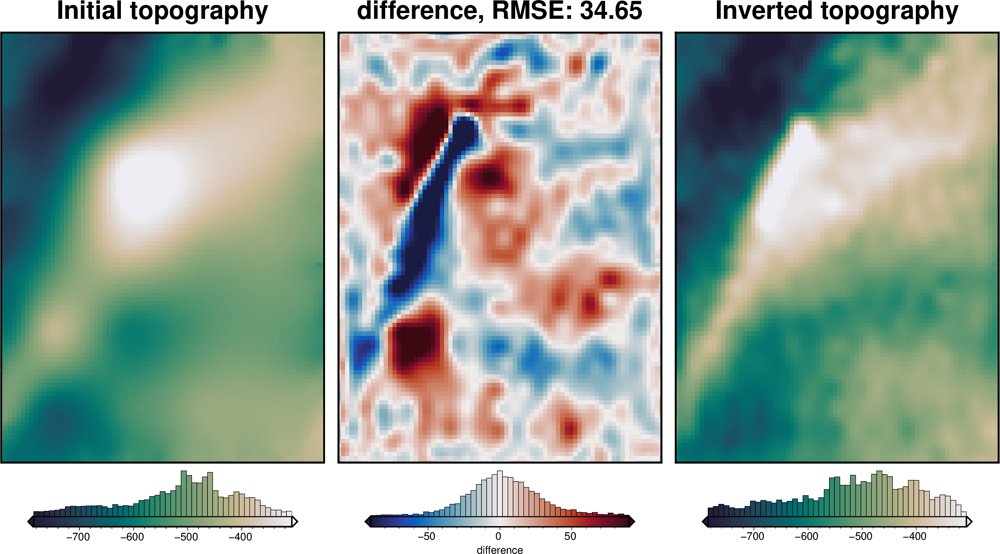

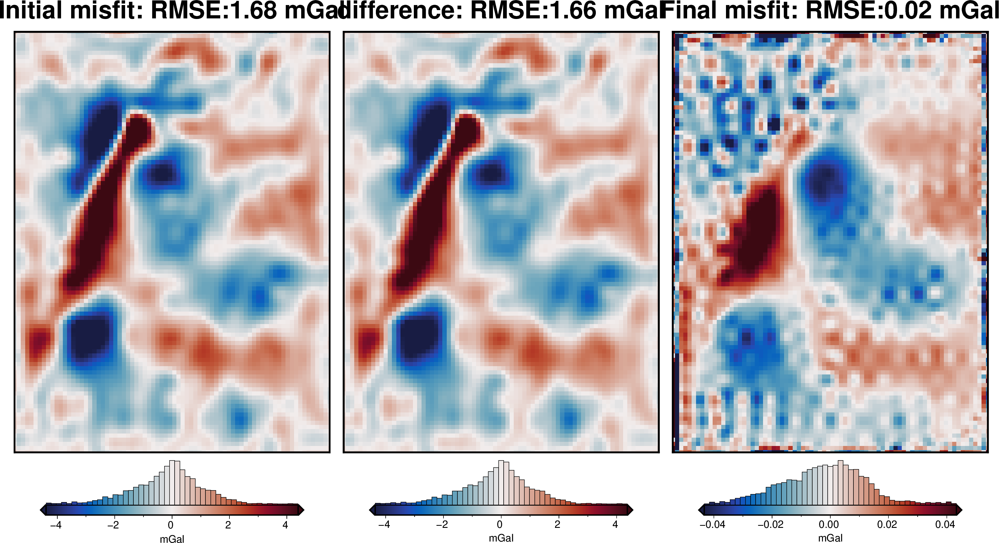

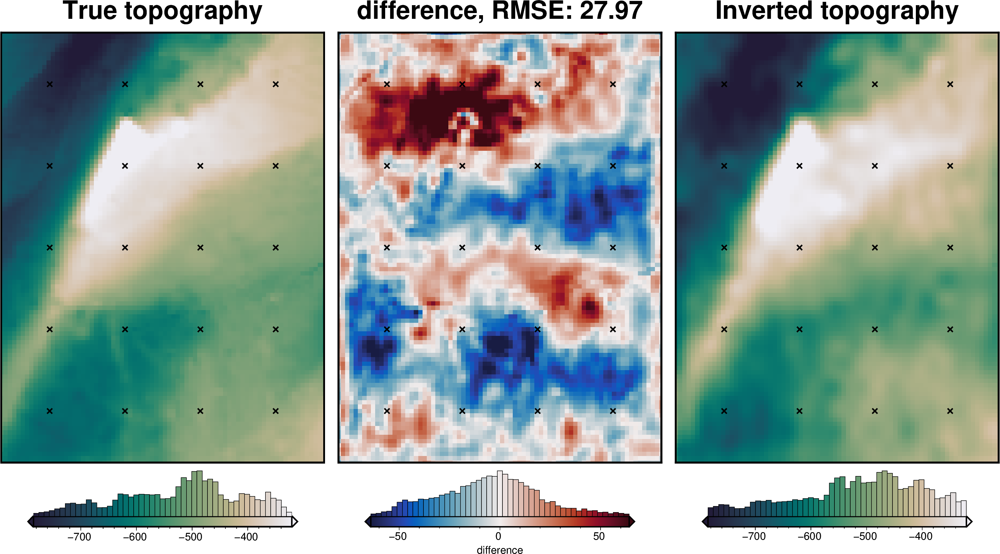

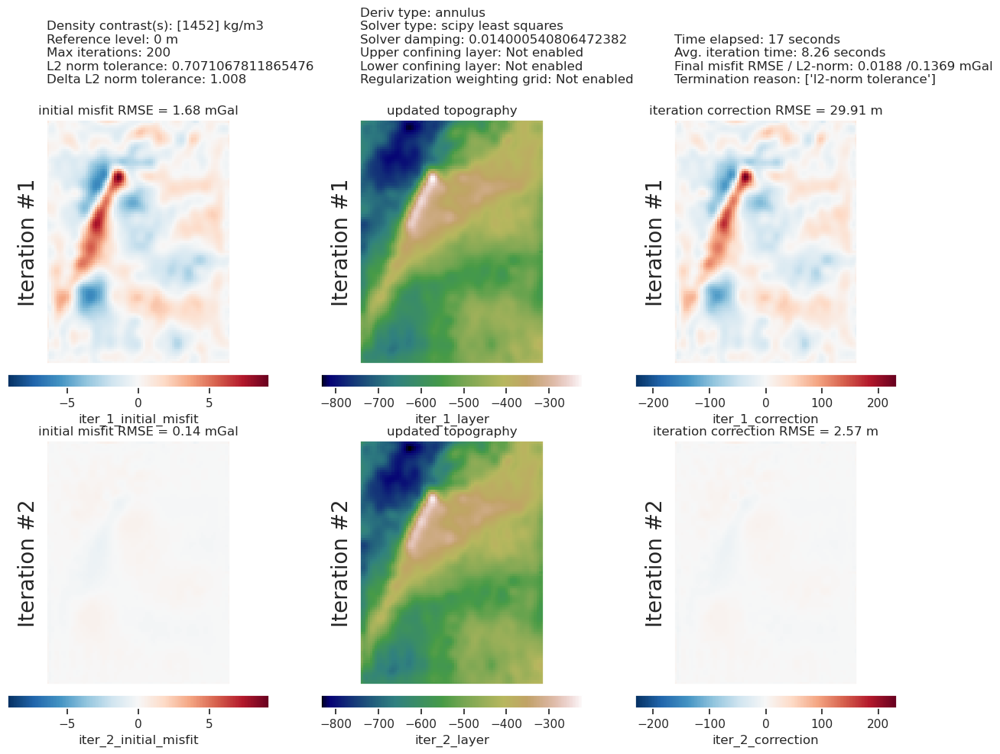

In [36]:
plotting.plot_inversion_results(
    grav_results,
    topo_results,
    parameters,
    inversion_region,
    iters_to_plot=2,
    plot_iter_results=True,
    plot_topo_results=True,
    plot_grav_results=True,
)

final_topography = topo_results.set_index(["northing", "easting"]).to_xarray().topo

_ = polar_utils.grd_compare(
    bathymetry,
    final_topography,
    region=inversion_region,
    plot=True,
    grid1_name="True topography",
    grid2_name="Inverted topography",
    robust=True,
    hist=True,
    inset=False,
    verbose="q",
    title="difference",
    grounding_line=False,
    reverse_cpt=True,
    cmap="rain",
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)

In [37]:
# sample the inverted topography at the constraint points
constraint_points = utils.sample_grids(
    constraint_points,
    final_topography,
    "inverted_topography",
    coord_names=("easting", "northing"),
)

rmse = utils.rmse(constraint_points.true_upward - constraint_points.inverted_topography)
print(f"RMSE: {rmse:.2f} m")

RMSE: 12.03 m


In [38]:
# save to csv
constraint_points.to_csv("../../results/Ross_Sea_07_constraint_points.csv", index=False)

# Uncertainty analysis

## Inversion error

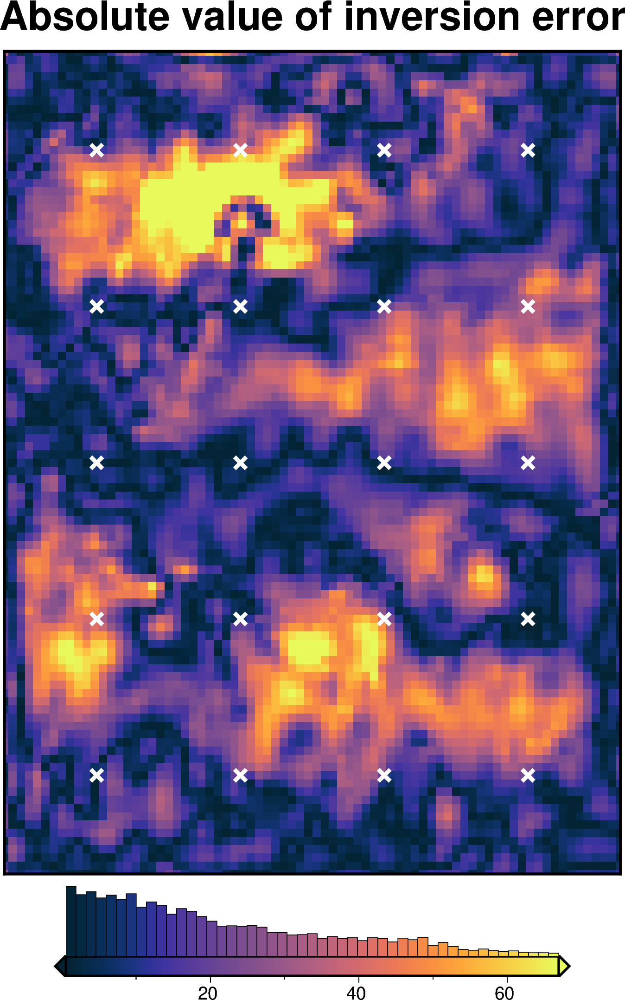

In [39]:
inversion_error = np.abs(bathymetry - final_topography)

fig = maps.plot_grd(
    inversion_error,
    region=inversion_region,
    # region=vd.pad_region(inversion_region, -3*spacing),
    hist=True,
    cmap="thermal",
    title="Absolute value of inversion error",
    robust=True,
    points=constraint_points[constraint_points.inside],
    points_style="x.3c",
    points_fill="white",
    points_pen="2p",
)
fig.show()

In [40]:
# re-load the study from the saved pickle file
with pathlib.Path(f"{regional_grav_kwargs.get('cv_kwargs').get('fname')}.pickle").open(
    "rb"
) as f:
    study = pickle.load(f)
# reg_eq_damping = min(study.best_trials, key=lambda t: t.values[0]).params["damping"]
reg_eq_depth = min(study.best_trials, key=lambda t: t.values[0]).params["depth"]

new_regional_grav_kwargs = dict(
    method="constraints",
    grid_method="eq_sources",
    constraints_df=constraint_points,
    damping=None,
    depth=reg_eq_depth,
    block_size=None,
)
reg_eq_depth

296659.4836532862

In [41]:
# kwargs to reuse for all uncertainty analyses
uncert_kwargs = dict(
    grav_df=grav_df,
    density_contrast=best_density_contrast,
    zref=zref,
    starting_prisms=starting_prisms,
    starting_topography=starting_bathymetry,
    regional_grav_kwargs=new_regional_grav_kwargs,
    **kwargs,
)

## Solver damping component

In [42]:
# load study
with pathlib.Path("../../results/Ross_Sea_07_damping_cv_damping_cv_study.pickle").open(
    "rb"
) as f:
    study = pickle.load(f)

study_df = study.trials_dataframe().drop(columns=["user_attrs_results"])
study_df = study_df.sort_values("value")

# calculate zscores of values
study_df["value_zscore"] = sp.stats.zscore(study_df["value"])

# drop outliers (values with zscore > |2|)
study_df2 = study_df[(np.abs(study_df.value_zscore) < 2)]

# pick damping standard deviation based on optimization
# to have a normal distribution a log scale, use the stdev of the log of the values
stdev = np.log10(study_df2.params_damping).std()

print(f"calculated stdev: {stdev}")
stdev = stdev / 4
print(f"using stdev: {stdev}")

calculated stdev: 0.4999816235394849
using stdev: 0.12499540588487122


best: 0.014000540806472382 
std: 0.12499540588487122 
+1std: 0.018669823730501484 
-1std: 0.010499035540087196


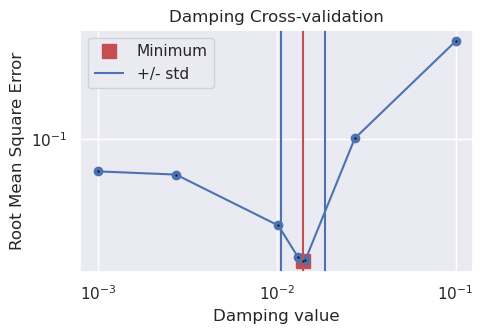

In [43]:
fig = plotting.plot_cv_scores(
    study_df.value,
    study_df.params_damping,
    param_name="Damping",
    logx=True,
    logy=True,
)
ax = fig.axes[0]

y_lims = ax.get_ylim()

# plot the best value
best = float(study_df2.params_damping.iloc[0])
ax.vlines(best, ymin=y_lims[0], ymax=y_lims[1], color="r")

# for a log scale, use the log of the best value, stdev already in log scale
upper = float(10 ** (np.log10(best) + stdev))
lower = float(10 ** (np.log10(best) - stdev))
ax.vlines(upper, ymin=y_lims[0], ymax=y_lims[1], label="+/- std")
ax.vlines(lower, ymin=y_lims[0], ymax=y_lims[1])

x_lims = ax.get_xlim()
ax.set_xlim(
    min(x_lims[0], lower),
    max(x_lims[1], upper),
)
ax.legend()
print("best:", best, "\nstd:", stdev, "\n+1std:", upper, "\n-1std:", lower)

INFO:invert4geom:Sampled 'solver_damping' parameter values; mean: 0.014517721804697906, min: 0.008720585913062146, max: 0.022477290497201183
INFO:invert4geom:all 10 runs already complete, loading results from files.


stochastic ensemble: 0it [00:00, ?it/s]

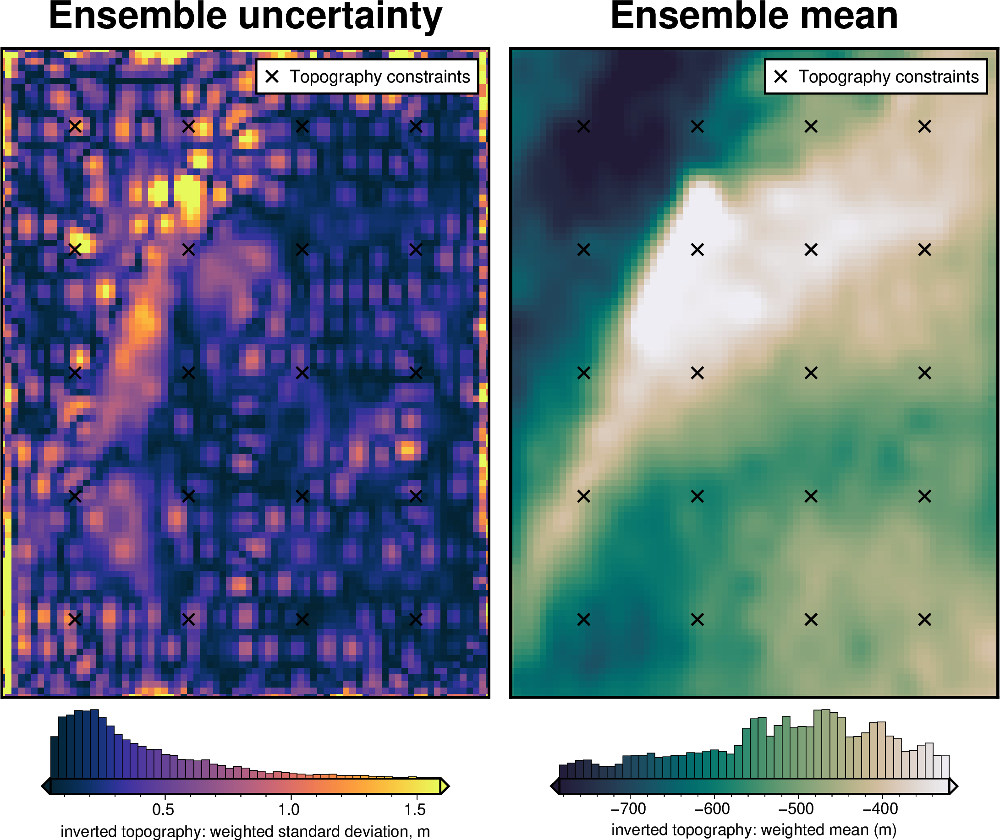

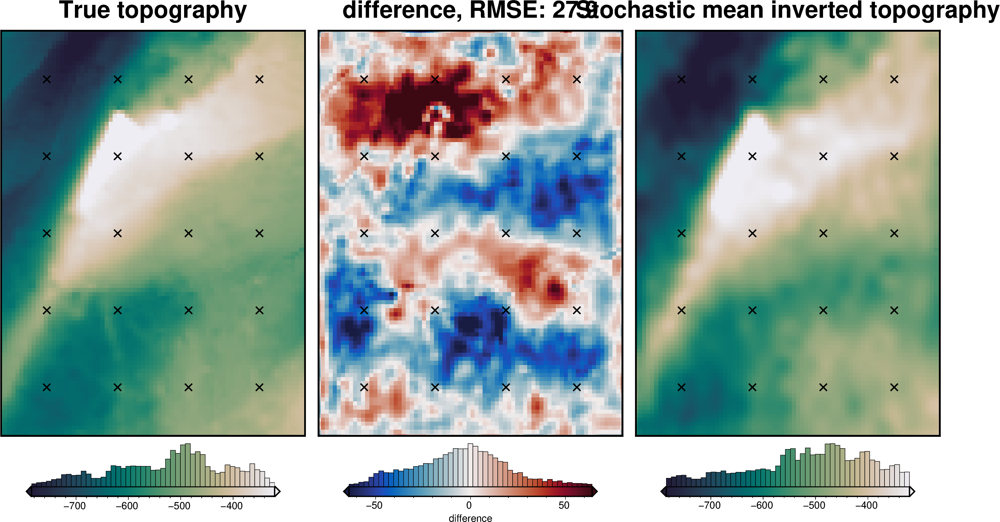

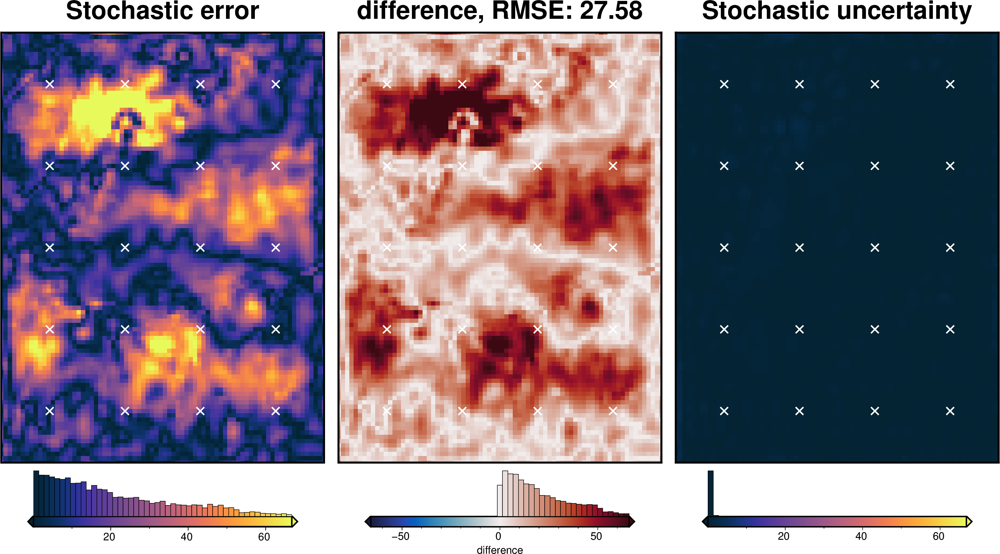

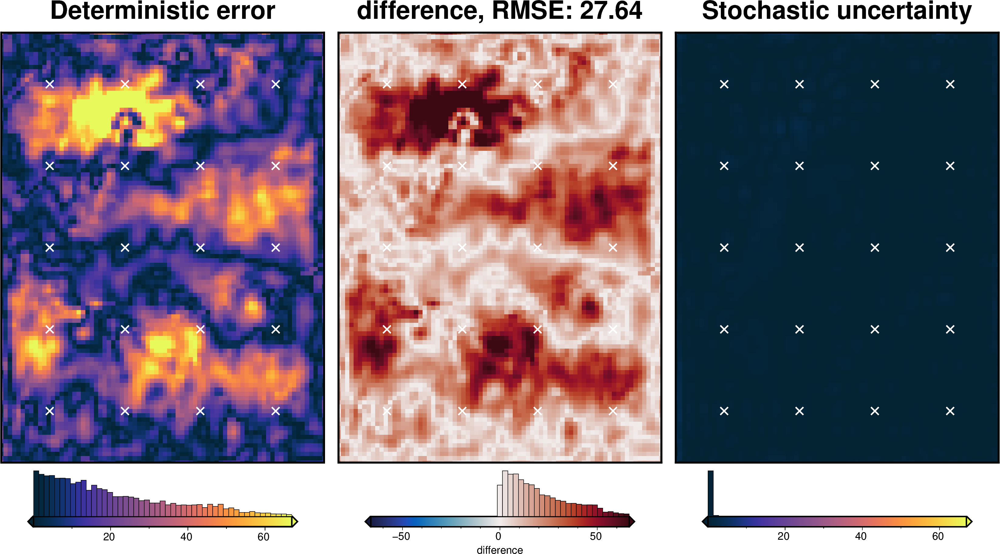

In [44]:
solver_dict = {
    "solver_damping": {
        "distribution": "normal",
        "loc": np.log10(
            best_damping
        ),  # mean of base 10 exponent, supply log10(value) here
        "scale": stdev,  # stdev of base 10 exponent, already in log10 form
        "log": True,
    },
}
fname = "../../results/Ross_Sea_07_uncertainty_damping"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_damping_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=10,
    parameter_dict=solver_dict,
    **uncert_kwargs,
)

stats_ds = RIS_plotting.uncert_plots(
    uncert_damping_results,
    # vd.pad_region(inversion_region, -3*spacing),
    inversion_region,
    spacing,
    bathymetry,
    deterministic_bathymetry=final_topography,
    constraint_points=constraint_points[constraint_points.inside],
    weight_by="constraints",
    # weight_by="residual",
    # weight_by=None,
)

## Density component

In [45]:
# load study
with pathlib.Path("../../results/Ross_Sea_07_density_cv_kfolds_study.pickle").open(
    "rb"
) as f:
    study = pickle.load(f)

study_df = study.trials_dataframe()
study_df = study_df.sort_values("value")

# calculate zscores of values
study_df["value_zscore"] = sp.stats.zscore(study_df["value"])

# drop outliers (values with zscore > |2|)
study_df2 = study_df[(np.abs(study_df.value_zscore) < 2)]

stdev = study_df2.params_density_contrast.std()
print(f"calculated stdev: {stdev}")

# manually pick a stdev
stdev = 60
print(f"using stdev: {stdev}")

print(
    f"density estimation error: {np.abs(true_density_contrast - best_density_contrast)}"
)

calculated stdev: 77.61167069823603
using stdev: 60
density estimation error: 24


best: 1452 
std: 60 
+1std: 1512 
-1std: 1392


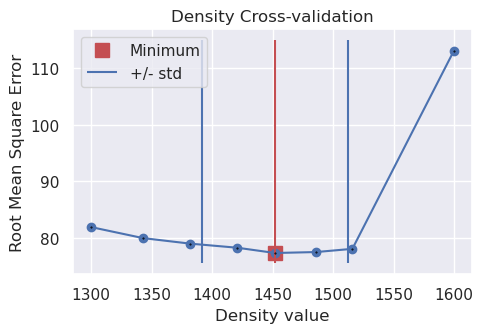

In [46]:
fig = plotting.plot_cv_scores(
    study.trials_dataframe().value.values,
    study.trials_dataframe().params_density_contrast.values,
    param_name="Density",
    logx=False,
    logy=False,
)
ax = fig.axes[0]

best = study_df2.params_density_contrast.iloc[0]
upper = best + stdev
lower = best - stdev

y_lims = ax.get_ylim()
ax.vlines(best, ymin=y_lims[0], ymax=y_lims[1], color="r")
ax.vlines(upper, ymin=y_lims[0], ymax=y_lims[1], label="+/- std")
ax.vlines(lower, ymin=y_lims[0], ymax=y_lims[1])

x_lims = ax.get_xlim()
ax.set_xlim(
    min(x_lims[0], lower),
    max(x_lims[1], upper),
)
ax.legend()
print("best:", best, "\nstd:", stdev, "\n+1std:", upper, "\n-1std:", lower)

INFO:invert4geom:Sampled 'density_contrast' parameter values; mean: 1452.0000000000002, min: 1353.3087823829117, max: 1550.6912176170883
INFO:invert4geom:No pickle files starting with '../../results/Ross_Sea_07_uncertainty_density' found, creating new files



stochastic ensemble:   0%|          | 0/10 [00:00<?, ?it/s]

INFO:invert4geom:starting stochastic uncertainty analysis at run 0 of 10
saving results to pickle files with prefix: '../../results/Ross_Sea_07_uncertainty_density'



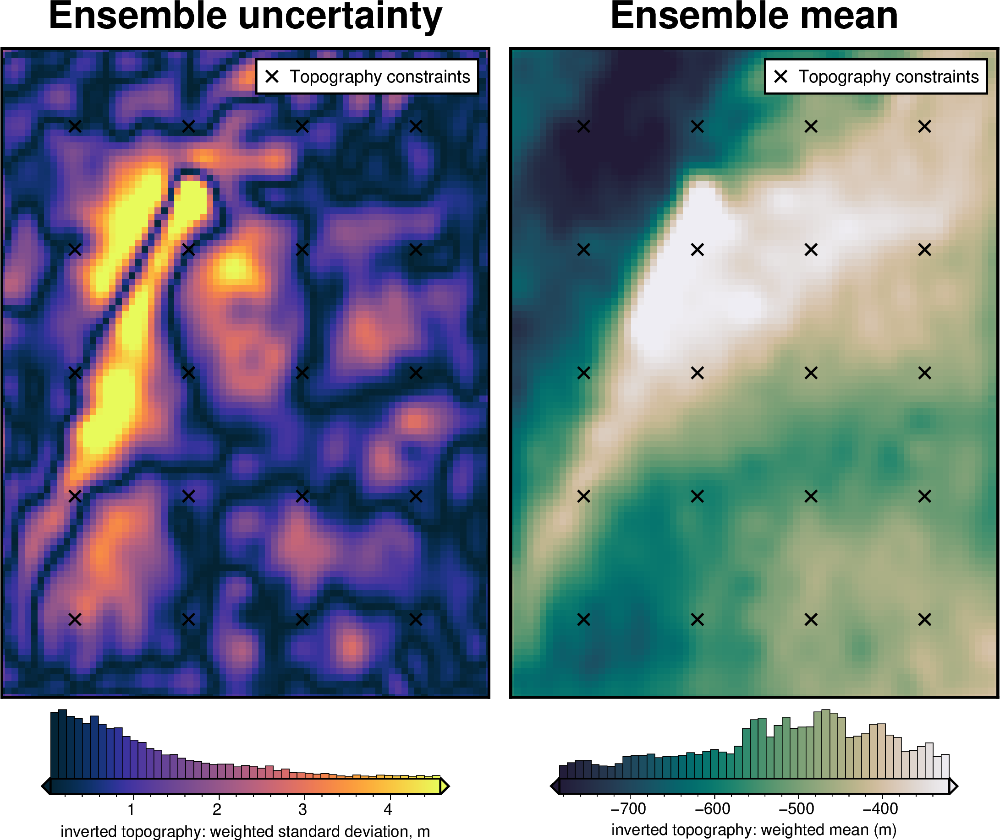

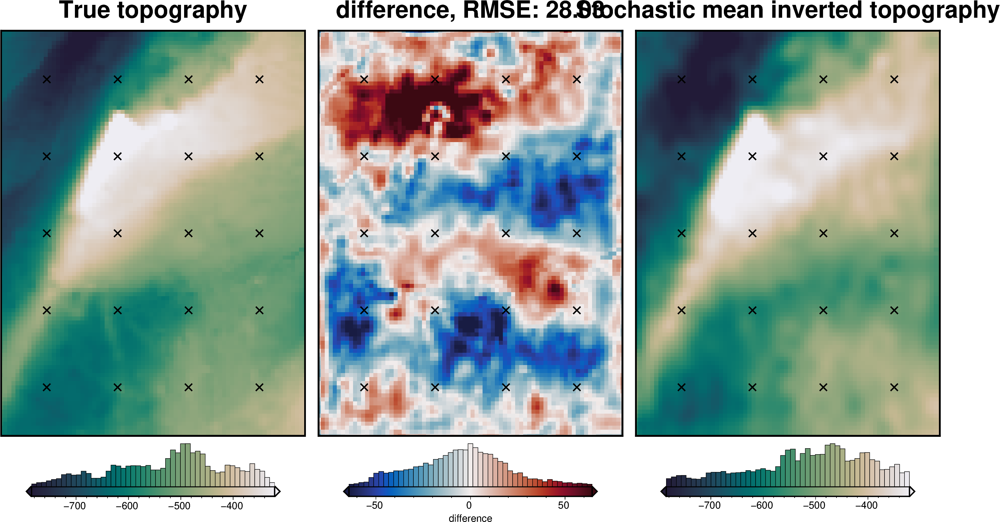

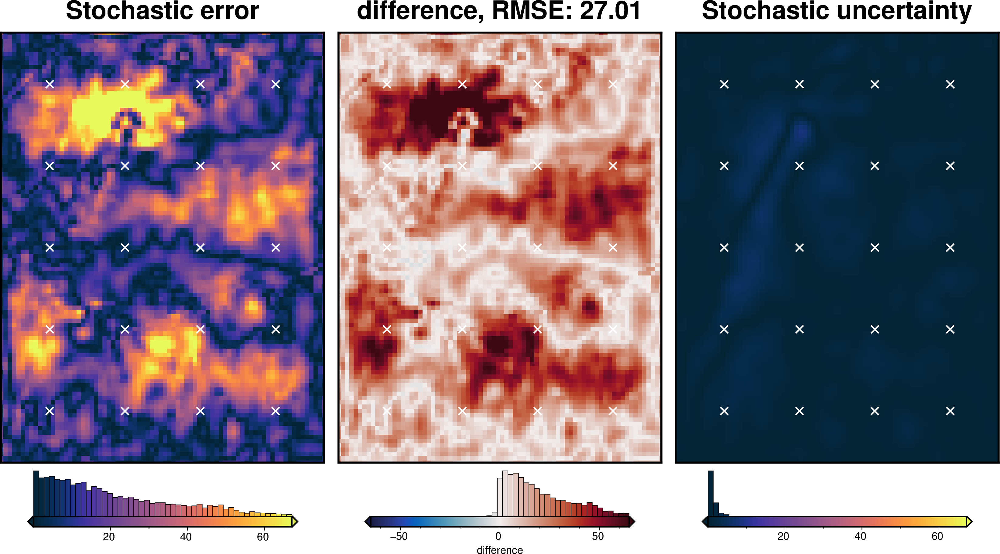

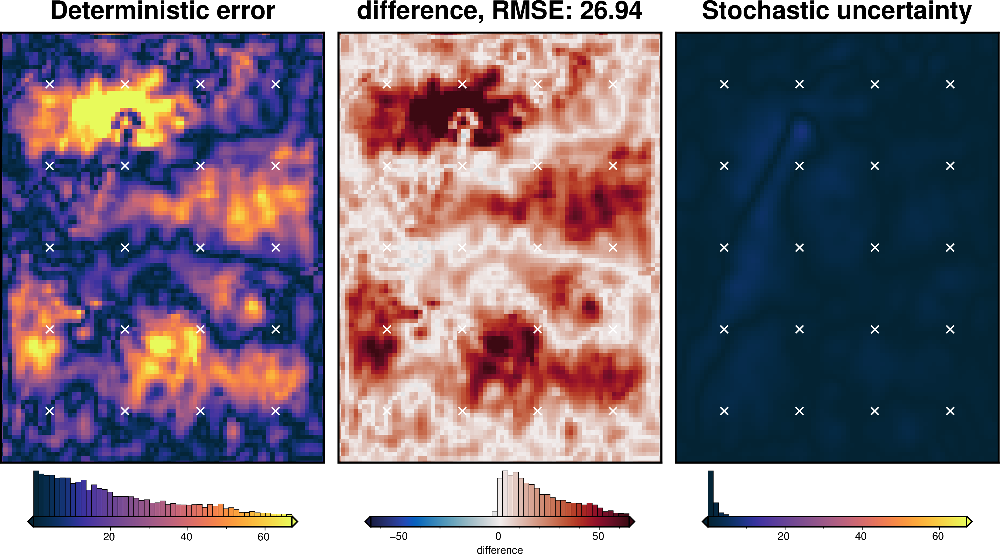

In [47]:
density_dict = {
    "density_contrast": {
        "distribution": "normal",
        "loc": best_density_contrast,
        "scale": stdev,
    },
}
fname = "../../results/Ross_Sea_07_uncertainty_density"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_density_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=10,
    parameter_dict=density_dict,
    **uncert_kwargs,
)

stats_ds = RIS_plotting.uncert_plots(
    uncert_density_results,
    # vd.pad_region(inversion_region, -3*spacing),
    inversion_region,
    spacing,
    bathymetry,
    deterministic_bathymetry=final_topography,
    constraint_points=constraint_points[constraint_points.inside],
    weight_by="constraints",
    # weight_by="residual",
    # weight_by=None,
)

## Constraints component

In [52]:
# # set uncertainty as 5% of each points depth
# uncert = np.abs(0.05 * constraint_points.upward)
# constraint_points.loc[constraint_points.index, "uncert"] = uncert
# constraint_points

INFO:invert4geom:all 10 runs already complete, loading results from files.


stochastic ensemble: 0it [00:00, ?it/s]

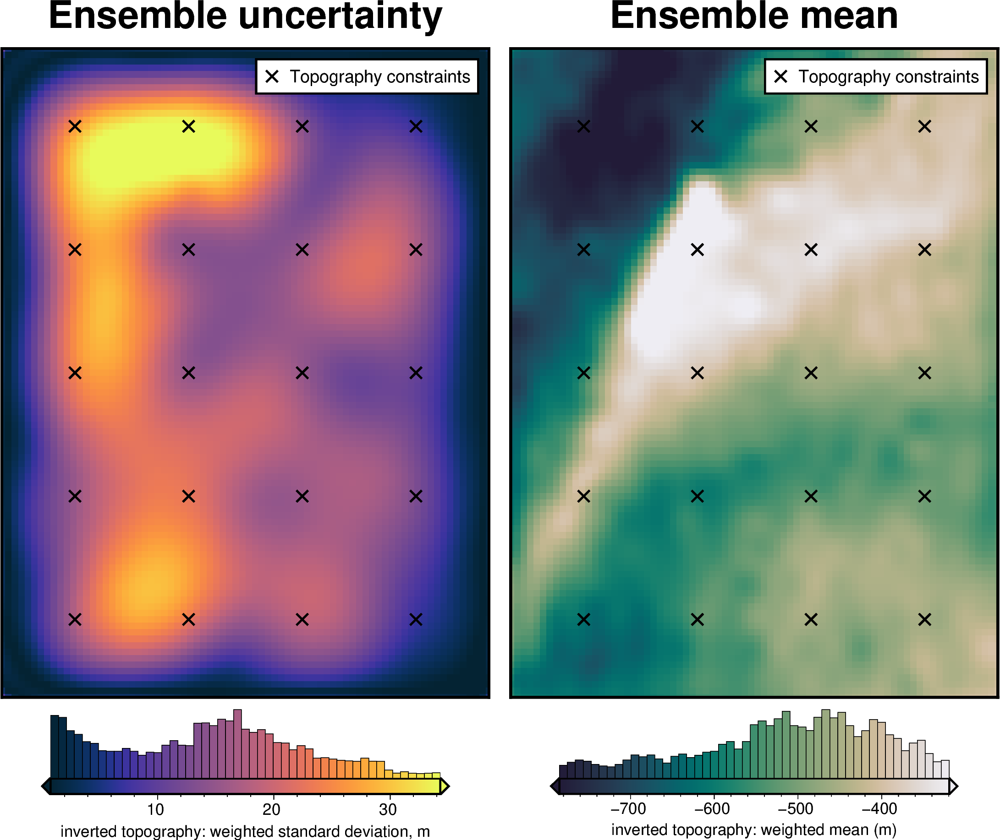

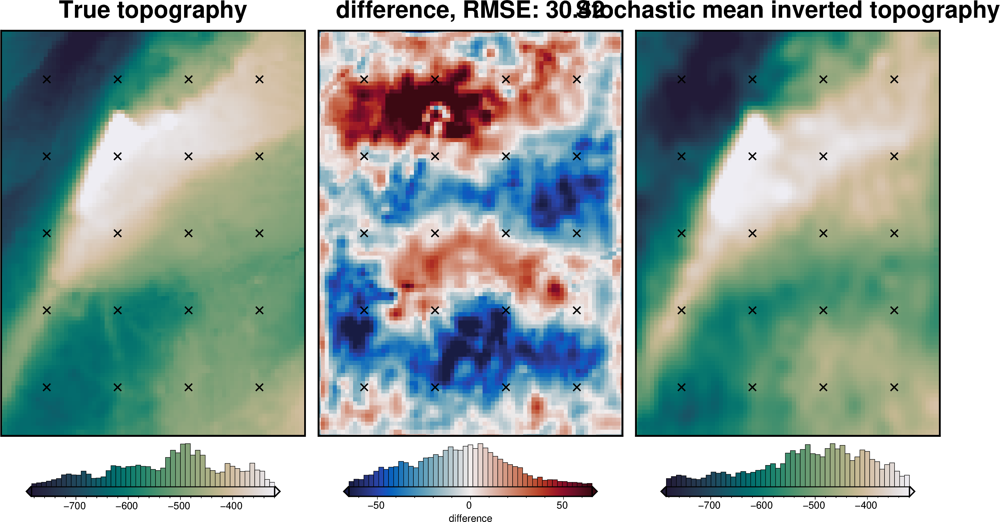

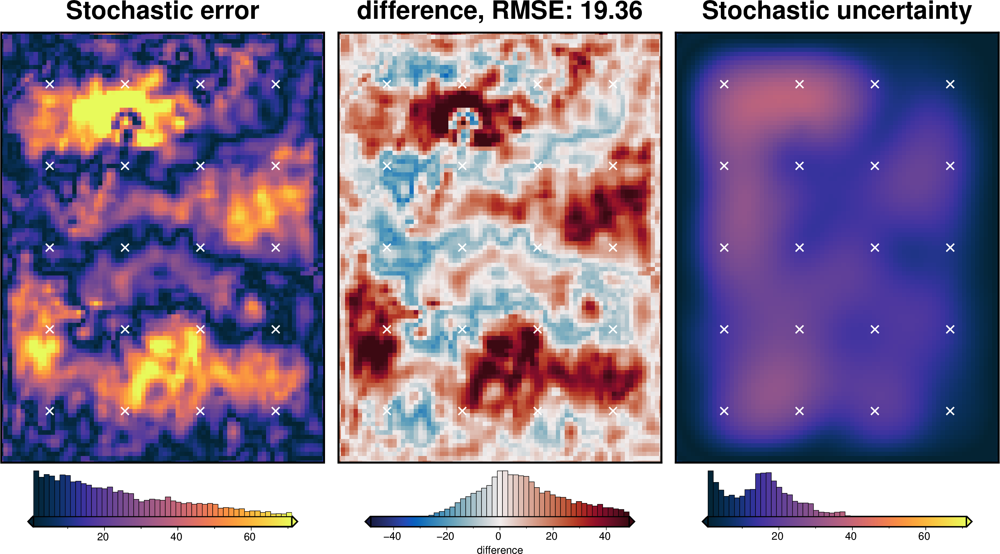

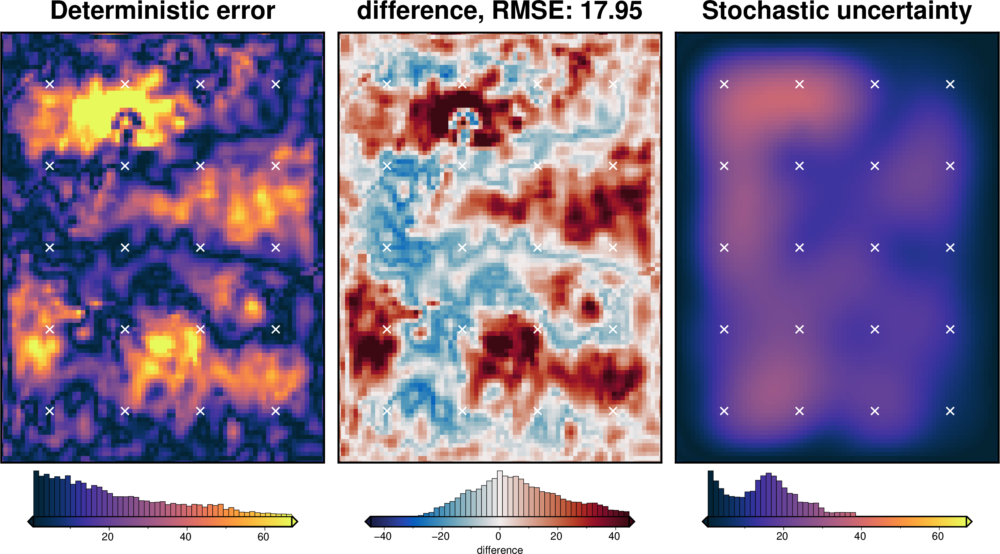

In [48]:
fname = "../../results/Ross_Sea_07_uncertainty_constraints"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_constraints_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    sample_constraints=True,
    constraints_df=constraint_points,
    starting_topography_kwargs=starting_topography_kwargs,
    runs=10,
    **uncert_kwargs,
)

stats_ds = RIS_plotting.uncert_plots(
    uncert_constraints_results,
    # vd.pad_region(inversion_region, -3*spacing),
    inversion_region,
    spacing,
    bathymetry,
    deterministic_bathymetry=final_topography,
    constraint_points=constraint_points[constraint_points.inside],
    weight_by="constraints",
    # weight_by="residual",
    # weight_by=None,
)

## Gravity component

In [54]:
# fname = "../../results/Ross_Sea_07_uncertainty_grav"

# # delete files if already exist
# for p in pathlib.Path().glob(f"{fname}*"):
#     p.unlink(missing_ok=True)

# uncert_grav_results = uncertainty.full_workflow_uncertainty_loop(
#     fname=fname,
#     runs=10,
#     sample_gravity=True,
#     **uncert_kwargs,
# )

# stats_ds = RIS_plotting.uncert_plots(
#     uncert_grav_results,
# #     # vd.pad_region(inversion_region, -3*spacing),
#     inversion_region,
#     spacing,
#     bathymetry,
#     deterministic_bathymetry=final_topography,
#     constraint_points=constraint_points[constraint_points.inside],
#     weight_by="constraints",
#     # weight_by="residual",
#     # weight_by=None,
# )

## Regional gravity component

In [72]:
reg_eq_depth

296659.4836532862

INFO:invert4geom:Sampled 'depth' parameter values; mean: 296659.48365328624, min: 169302.11845831608, max: 424016.8488482563


starting regional ensemble:   0%|          | 0/100 [00:00<?, ?it/s]

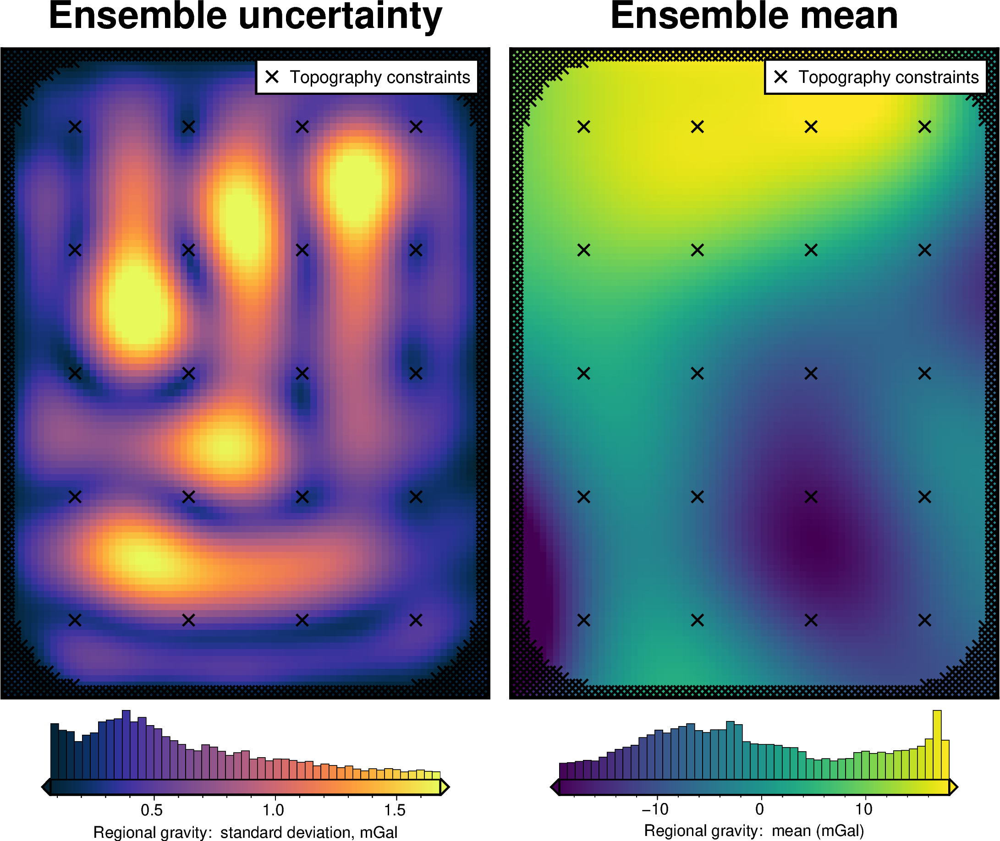

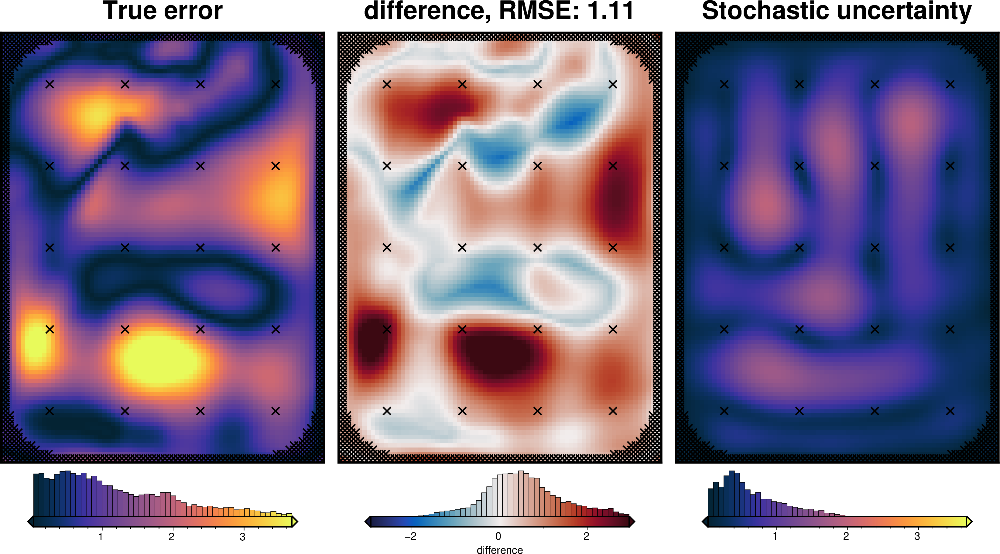

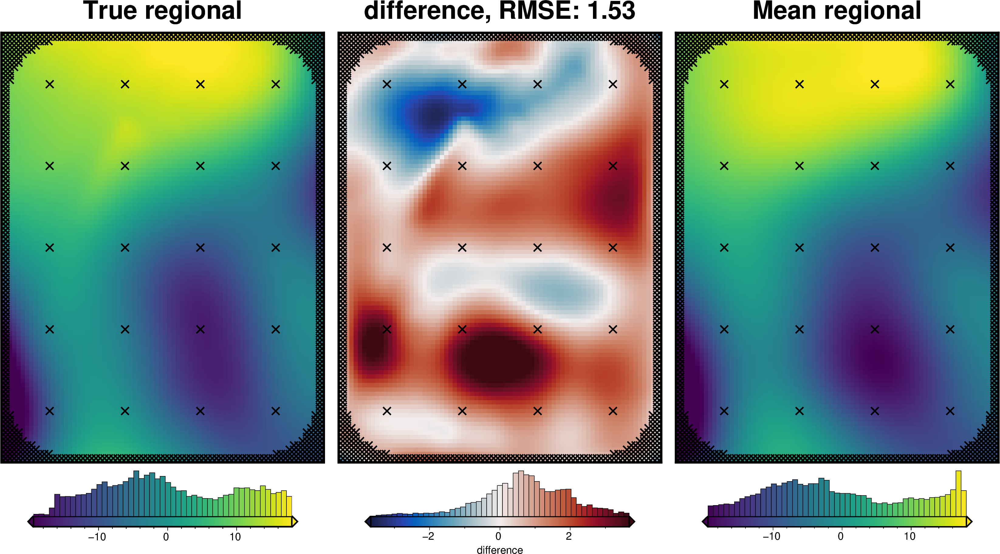

In [73]:
regional_misfit_parameter_dict = {
    "depth": {
        "distribution": "normal",
        "loc": reg_eq_depth,  # mean
        "scale": reg_eq_depth / 6,  # standard deviation
    },
    # "damping": {
    #     "distribution": "normal",
    #     "loc": np.log10(reg_eq_damping),  # mean base 10 exponent
    #     "scale": np.abs(np.log10(reg_eq_damping)) / 2,  # standard deviation of exponent
    #     "log": True,
    # },
}

regional_misfit_stats = uncertainty.regional_misfit_uncertainty(
    runs=100,
    parameter_dict=regional_misfit_parameter_dict,
    # plot_region=vd.pad_region(inversion_region, -3*spacing),
    plot_region=inversion_region,
    true_regional=grav_grid.basement_grav,
    # weight_by="constraints",
    # weight_by="residual",
    # weight_by=None,
    grav_df=grav_df,
    **new_regional_grav_kwargs,
)

In [74]:
grav_df = utils.sample_grids(
    grav_df,
    regional_misfit_stats.z_stdev,
    sampled_name="reg_uncert",
    coord_names=["easting", "northing"],
)
grav_df = utils.sample_grids(
    grav_df,
    regional_misfit_stats.z_mean,
    sampled_name="reg_stochastic",
    coord_names=["easting", "northing"],
)
grav_df

,northing,easting,upward,bathymetry_grav,basement_grav_normalized,basement_grav,gravity_anomaly_full_res_no_noise,gravity_anomaly_full_res,uncert,eqs_gravity_anomaly,...,starting_gravity,true_res,misfit,reg,res,predicted_grav,eqs_uncert,gravity_anomaly_eqs_mean,reg_uncert,reg_stochastic
0,-1600000.0,-40000.0,1000.0,-35.551041,-0.576200,-20.166076,-55.717117,-56.108610,0.5,-51.642166,...,-34.990199,-3.018832,-16.651967,-17.267944,0.615977,-51.423032,1.517498,-51.192039,0.437355,-17.282141
1,-1600000.0,-38000.0,1000.0,-36.054652,-0.523887,-18.858229,-54.912881,-55.483439,0.5,-51.808887,...,-35.446562,-3.098138,-16.362325,-16.595053,0.232728,-51.225398,1.202784,-51.416691,0.250722,-16.555248
2,-1600000.0,-36000.0,1000.0,-36.473148,-0.467097,-17.438478,-53.911626,-54.600484,0.5,-51.379621,...,-35.856864,-3.135155,-15.522757,-15.703065,0.180308,-50.631327,1.044704,-51.069912,0.149903,-15.626705
3,-1600000.0,-34000.0,1000.0,-36.755612,-0.406792,-15.930867,-52.686479,-53.347323,0.5,-50.574836,...,-36.175683,-3.121196,-14.399153,-14.641349,0.242196,-49.940419,0.965152,-50.364319,0.115322,-14.542383
4,-1600000.0,-32000.0,1000.0,-36.951032,-0.343951,-14.359836,-51.310869,-51.806348,0.5,-49.577791,...,-36.385529,-3.121512,-13.192262,-13.453862,0.261600,-49.120645,0.883932,-49.440144,0.109523,-13.343302
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7671,-1400000.0,102000.0,1000.0,-25.760380,0.399106,4.216576,-21.543804,-21.067825,0.5,-20.722669,...,-25.087750,-2.434992,4.365081,4.106736,0.258345,-20.797229,0.336092,-20.715330,0.185322,4.393736
7672,-1400000.0,104000.0,1000.0,-25.911731,0.334770,2.608194,-23.303537,-22.622355,0.5,-22.061789,...,-25.259964,-2.426227,3.198176,2.963214,0.234961,-21.920906,0.419122,-21.962910,0.167658,3.246990
7673,-1400000.0,106000.0,1000.0,-26.033127,0.268772,0.958236,-25.074891,-24.272173,0.5,-23.193245,...,-25.392308,-2.424576,2.199063,1.931657,0.267405,-22.892125,0.530195,-23.009872,0.156889,2.175148
7674,-1400000.0,108000.0,1000.0,-26.122232,0.201841,-0.715051,-26.837283,-26.099743,0.5,-24.003795,...,-25.486067,-2.426508,1.482272,1.062554,0.419718,-23.969446,0.683776,-23.812496,0.188650,1.216036


In [75]:
# save to csv
grav_df.to_csv("../../results/Ross_Sea_07_grav_df.csv", index=False)

In [76]:
# update grav_df and temporarily rename column
uncert_kwargs["grav_df"] = grav_df.drop(columns="reg").rename(
    columns={
        "reg_stochastic": "reg",
    }
)
uncert_kwargs["grav_df"].reg

0      -17.282141
1      -16.555248
2      -15.626705
3      -14.542383
4      -13.343302
          ...    
7671     4.393736
7672     3.246990
7673     2.175148
7674     1.216036
7675     0.412535
Name: reg, Length: 7676, dtype: float64

INFO:invert4geom:Sampled 'depth' parameter values; mean: 296659.4836532861, min: 215332.57904384303, max: 377986.3882627293
INFO:invert4geom:No pickle files starting with '../../results/Ross_Sea_07_uncertainty_regional' found, creating new files



stochastic ensemble:   0%|          | 0/10 [00:00<?, ?it/s]

INFO:invert4geom:starting stochastic uncertainty analysis at run 0 of 10
saving results to pickle files with prefix: '../../results/Ross_Sea_07_uncertainty_regional'



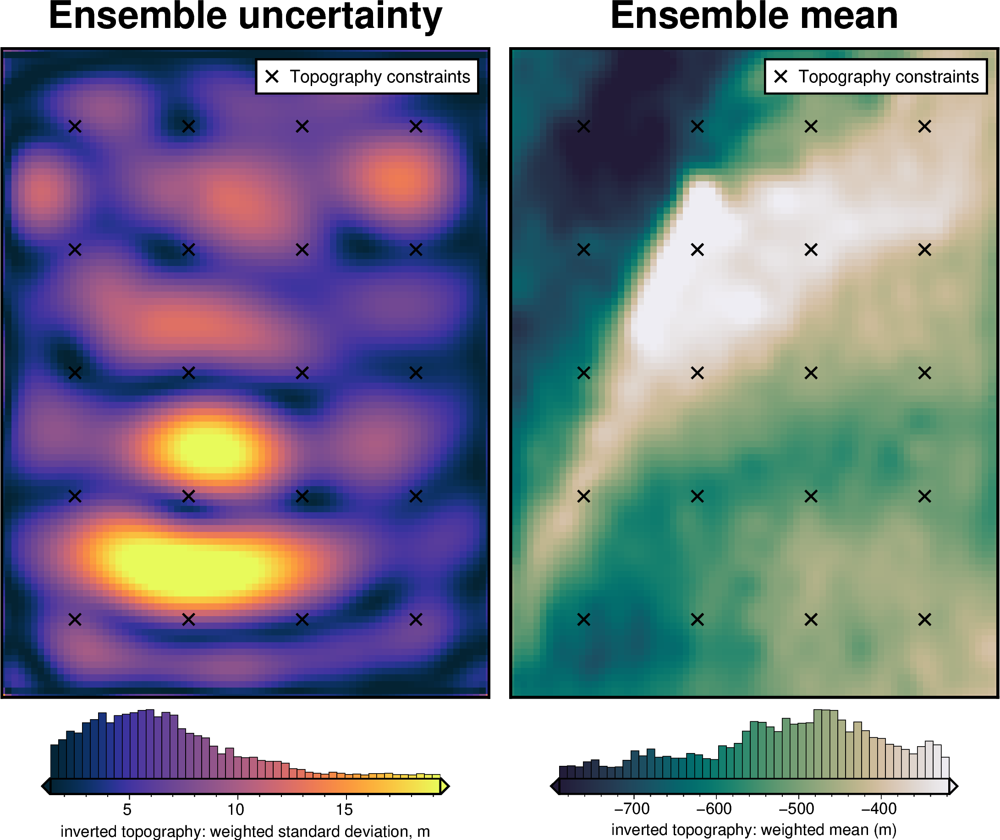

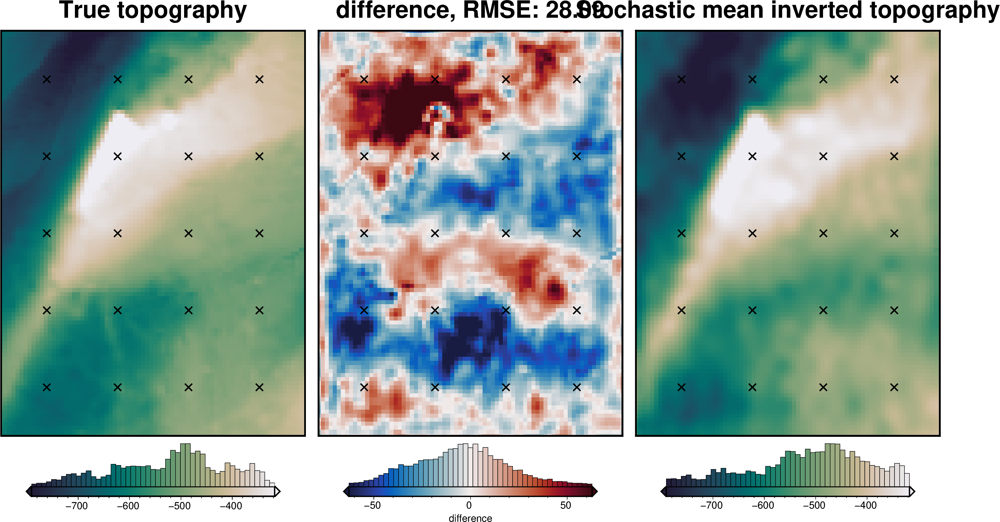

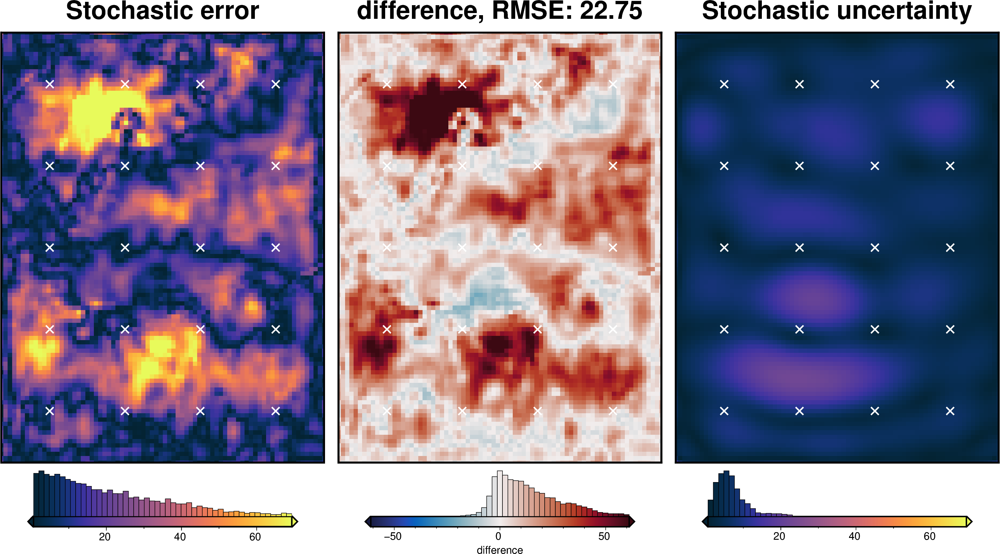

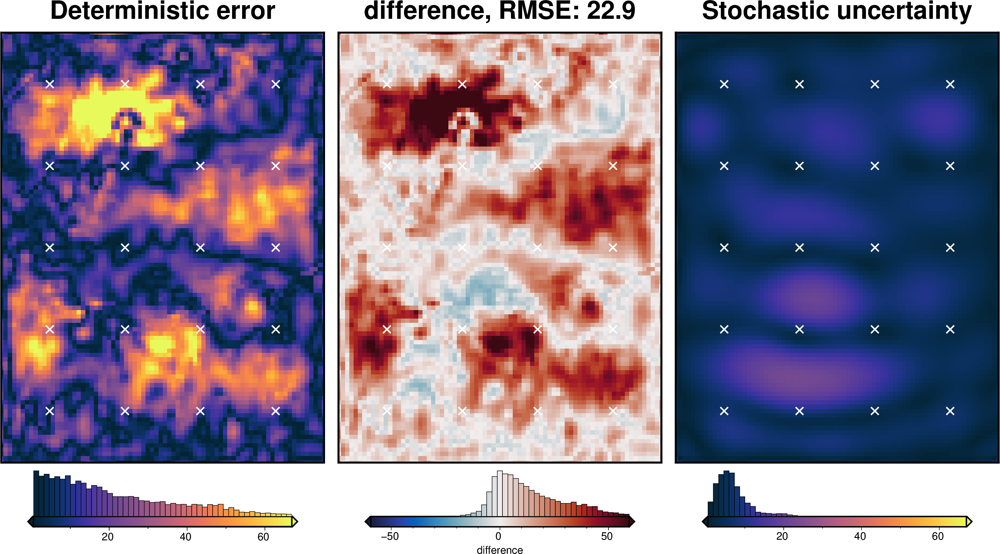

In [77]:
fname = "../../results/Ross_Sea_07_uncertainty_regional"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_regional_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=10,
    regional_misfit_parameter_dict=regional_misfit_parameter_dict,
    **uncert_kwargs,
)

stats_ds = RIS_plotting.uncert_plots(
    uncert_regional_results,
    # vd.pad_region(inversion_region, -3*spacing),
    inversion_region,
    spacing,
    bathymetry,
    deterministic_bathymetry=final_topography,
    constraint_points=constraint_points[constraint_points.inside],
    weight_by="constraints",
    # weight_by="residual",
    # weight_by=None,
)

## Equivalent source gridding component

In [85]:
eqs.depth, eqs.damping

(9414.437721470877, 0.5023336514396778)

INFO:invert4geom:Sampled 'depth' parameter values; mean: 9414.437721470877, min: 5543.094713503344, max: 13285.780729438407
INFO:invert4geom:Sampled 'damping' parameter values; mean: 17.069712323887437, min: 0.001745309884233009, max: 144.5812572588574


starting equivalent sources ensemble:   0%|          | 0/10 [00:00<?, ?it/s]

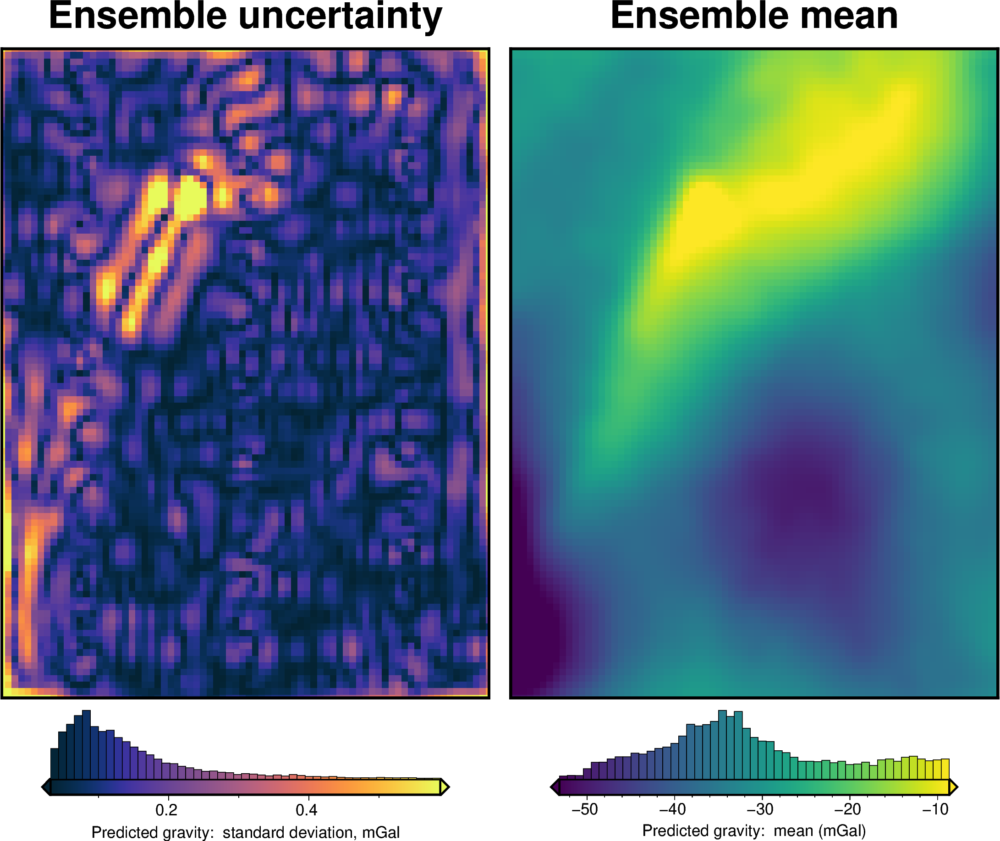

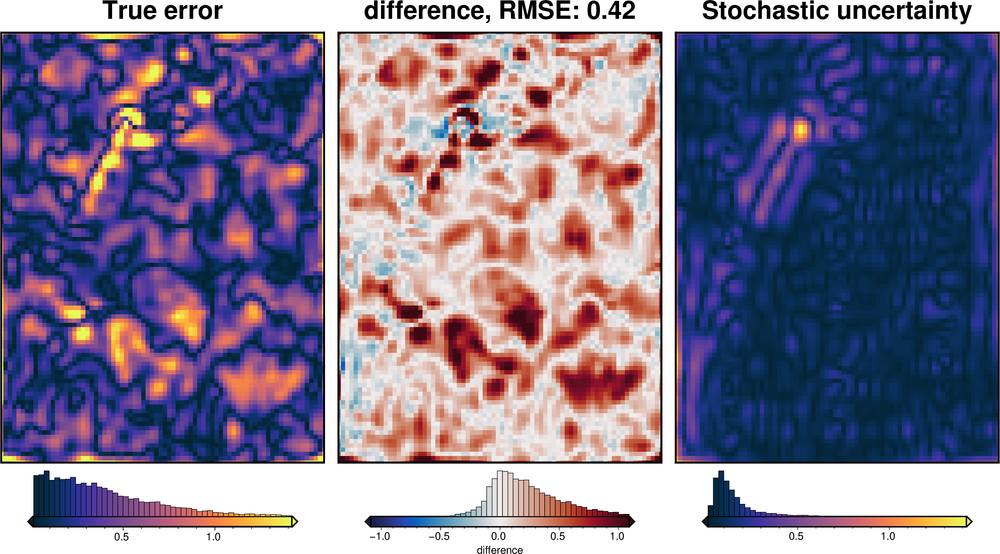

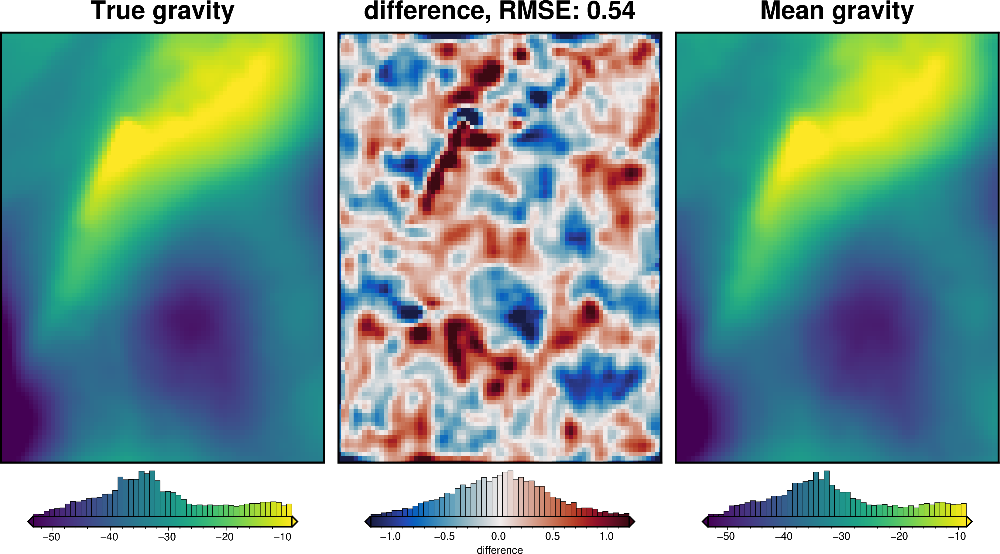

In [86]:
# grid the airborne survey data over the whole grid
coords = (grav_survey_df.easting, grav_survey_df.northing, grav_survey_df.upward)
data = grav_survey_df.gravity_anomaly

equivalent_source_parameter_dict = {
    "depth": {
        # "distribution": "uniform",
        # "loc": 2*min_dist,  # lower bound
        # "scale": 6*min_dist,  # range
        "distribution": "normal",
        "loc": eqs.depth,  # mean
        "scale": eqs.depth / 4,  # 20e3,  # standard deviation
    },
    "damping": {
        # "distribution": "uniform",
        # "loc": -40,  # lower bound base 10 exponent
        # "scale": 40,  # range of exponent
        "log": True,
        "distribution": "normal",
        "loc": np.log10(
            eqs.damping
        ),  # mean of base 10 exponent, supply log10(value) here
        "scale": np.abs(np.log10(eqs.damping))
        * 5,  # stdev of base 10 exponent, supply log10(value) here
    },
}

eqs_kwargs = dict(
    block_size=spacing,
    damping=eqs.damping,
    depth=eqs.depth,
)

eqs_stats = uncertainty.equivalent_sources_uncertainty(
    runs=10,
    data=data,
    coords=coords,
    grid_points=grav_df,
    parameter_dict=equivalent_source_parameter_dict,
    # plot_region=vd.pad_region(inversion_region, -3*spacing),
    plot_region=inversion_region,
    true_gravity=grav_df.set_index(["northing", "easting"])
    .to_xarray()
    .gravity_anomaly_full_res_no_noise,
    # weight_by="score",
    # weight_by="rmse",
    **eqs_kwargs,
)

In [87]:
grav_df = utils.sample_grids(
    grav_df,
    eqs_stats.z_stdev,
    sampled_name="eqs_uncert",
    coord_names=["easting", "northing"],
)
grav_df = utils.sample_grids(
    grav_df,
    eqs_stats.z_mean,
    sampled_name="gravity_anomaly_eqs_mean",
    coord_names=["easting", "northing"],
)
grav_df

,northing,easting,upward,bathymetry_grav,basement_grav_normalized,basement_grav,gravity_anomaly_full_res_no_noise,gravity_anomaly_full_res,uncert,eqs_gravity_anomaly,...,starting_gravity,true_res,misfit,reg,res,predicted_grav,reg_uncert,reg_stochastic,eqs_uncert,gravity_anomaly_eqs_mean
0,-1600000.0,-40000.0,1000.0,-35.551041,-0.576200,-20.166076,-55.717117,-56.108610,0.5,-51.642166,...,-34.990199,-3.018832,-16.651967,-17.267944,0.615977,-51.423032,0.437355,-17.282141,1.517498,-51.192039
1,-1600000.0,-38000.0,1000.0,-36.054652,-0.523887,-18.858229,-54.912881,-55.483439,0.5,-51.808887,...,-35.446562,-3.098138,-16.362325,-16.595053,0.232728,-51.225398,0.250722,-16.555248,1.202784,-51.416691
2,-1600000.0,-36000.0,1000.0,-36.473148,-0.467097,-17.438478,-53.911626,-54.600484,0.5,-51.379621,...,-35.856864,-3.135155,-15.522757,-15.703065,0.180308,-50.631327,0.149903,-15.626705,1.044704,-51.069912
3,-1600000.0,-34000.0,1000.0,-36.755612,-0.406792,-15.930867,-52.686479,-53.347323,0.5,-50.574836,...,-36.175683,-3.121196,-14.399153,-14.641349,0.242196,-49.940419,0.115322,-14.542383,0.965152,-50.364319
4,-1600000.0,-32000.0,1000.0,-36.951032,-0.343951,-14.359836,-51.310869,-51.806348,0.5,-49.577791,...,-36.385529,-3.121512,-13.192262,-13.453862,0.261600,-49.120645,0.109523,-13.343302,0.883932,-49.440144
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7671,-1400000.0,102000.0,1000.0,-25.760380,0.399106,4.216576,-21.543804,-21.067825,0.5,-20.722669,...,-25.087750,-2.434992,4.365081,4.106736,0.258345,-20.797229,0.185322,4.393736,0.336092,-20.715330
7672,-1400000.0,104000.0,1000.0,-25.911731,0.334770,2.608194,-23.303537,-22.622355,0.5,-22.061789,...,-25.259964,-2.426227,3.198176,2.963214,0.234961,-21.920906,0.167658,3.246990,0.419122,-21.962910
7673,-1400000.0,106000.0,1000.0,-26.033127,0.268772,0.958236,-25.074891,-24.272173,0.5,-23.193245,...,-25.392308,-2.424576,2.199063,1.931657,0.267405,-22.892125,0.156889,2.175148,0.530195,-23.009872
7674,-1400000.0,108000.0,1000.0,-26.122232,0.201841,-0.715051,-26.837283,-26.099743,0.5,-24.003795,...,-25.486067,-2.426508,1.482272,1.062554,0.419718,-23.969446,0.188650,1.216036,0.683776,-23.812496


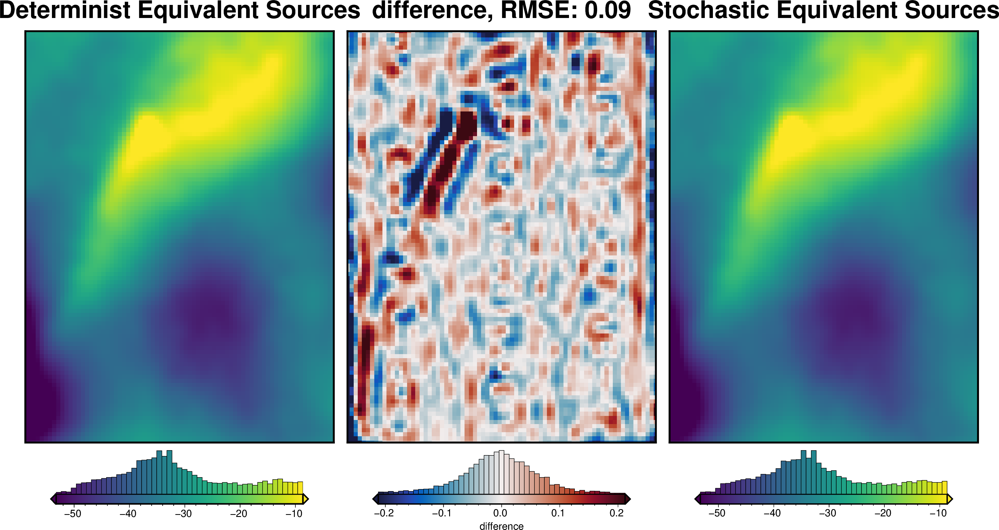

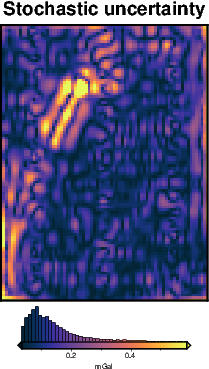

In [88]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()
_ = polar_utils.grd_compare(
    grav_grid.gravity_anomaly,
    grav_grid.gravity_anomaly_eqs_mean,
    region=inversion_region,
    plot=True,
    grid1_name="Determinist Equivalent Sources",
    grid2_name="Stochastic Equivalent Sources",
    robust=True,
    hist=True,
    inset=False,
    verbose="q",
    title="difference",
    grounding_line=False,
)
maps.plot_grd(
    grav_grid.eqs_uncert,
    region=inversion_region,
    fig_height=10,
    title="Stochastic uncertainty",
    cmap="thermal",
    hist=True,
    robust=True,
    cbar_label="mGal",
)

In [89]:
# update grav_df and rename columns
grav_df_eqs = grav_df.copy()
grav_df_eqs = grav_df_eqs.rename(
    columns={
        "gravity_anomaly": "gravity_anomaly_deterministic",
        "uncert": "uncert_constant",
    }
)
grav_df_eqs["gravity_anomaly"] = grav_df_eqs.gravity_anomaly_eqs_mean
grav_df_eqs["uncert"] = grav_df_eqs.eqs_uncert

uncert_kwargs["grav_df"] = grav_df_eqs

In [90]:
grav_df_eqs = regional.regional_separation(
    grav_df=grav_df_eqs,
    **new_regional_grav_kwargs,
)
# kwargs to reuse for all uncertainty analyses
eqs_uncert_kwargs = dict(
    grav_df=grav_df_eqs,
    density_contrast=best_density_contrast,
    zref=zref,
    starting_prisms=starting_prisms,
    starting_topography=starting_bathymetry,
    regional_grav_kwargs=new_regional_grav_kwargs,
    **kwargs,
)

In [91]:
# save to csv
grav_df_eqs.to_csv("../../results/Ross_Sea_07_grav_df.csv", index=False)

INFO:invert4geom:No pickle files starting with '../../results/Ross_Sea_07_uncertainty_eq_sources' found, creating new files



stochastic ensemble:   0%|          | 0/10 [00:00<?, ?it/s]

INFO:invert4geom:starting stochastic uncertainty analysis at run 0 of 10
saving results to pickle files with prefix: '../../results/Ross_Sea_07_uncertainty_eq_sources'



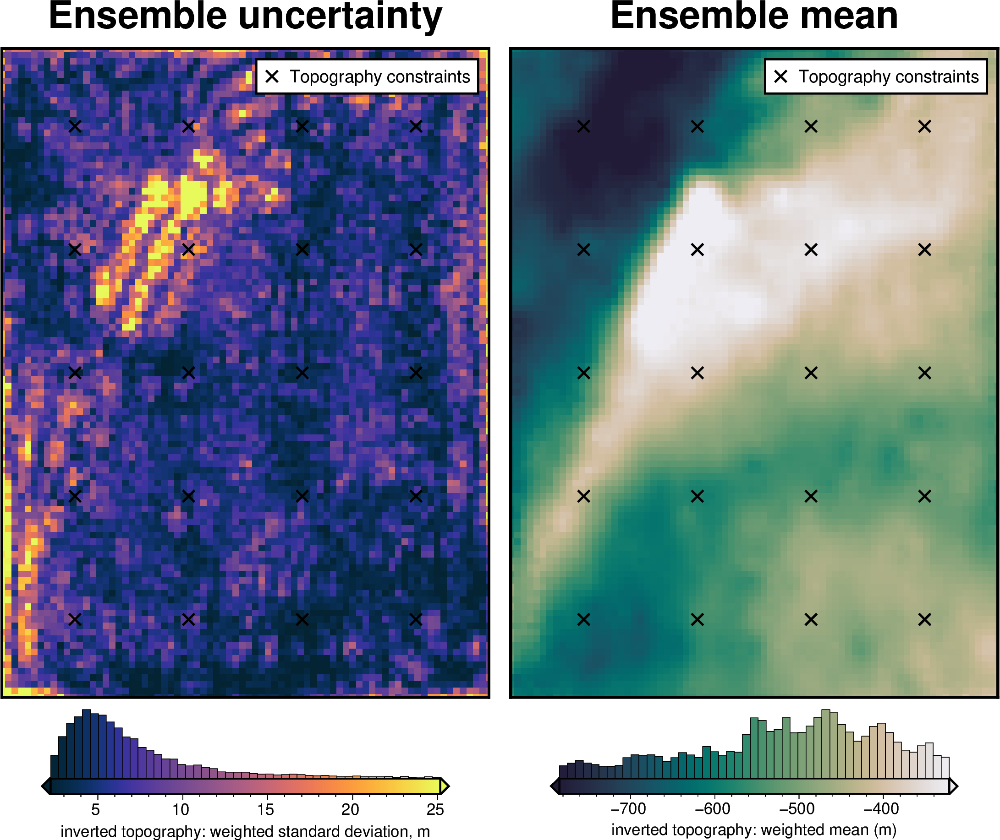

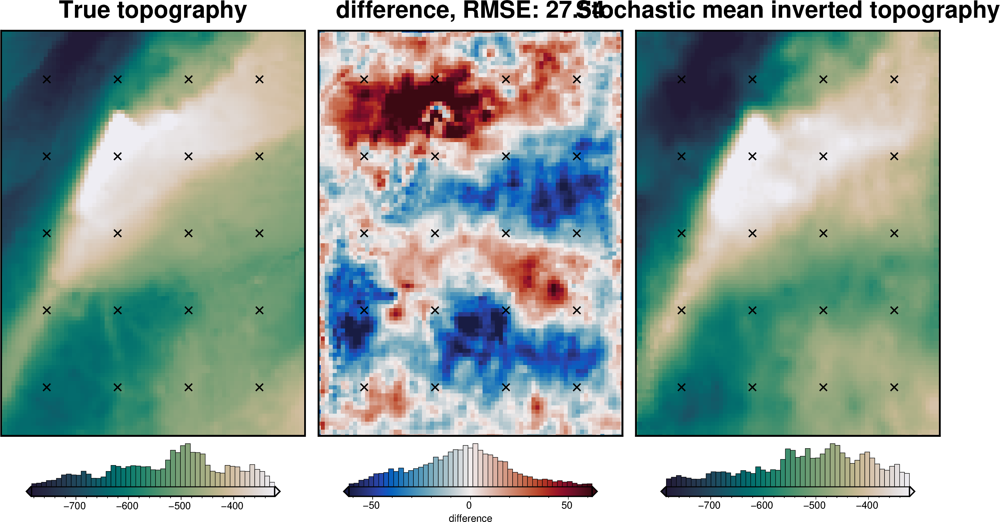

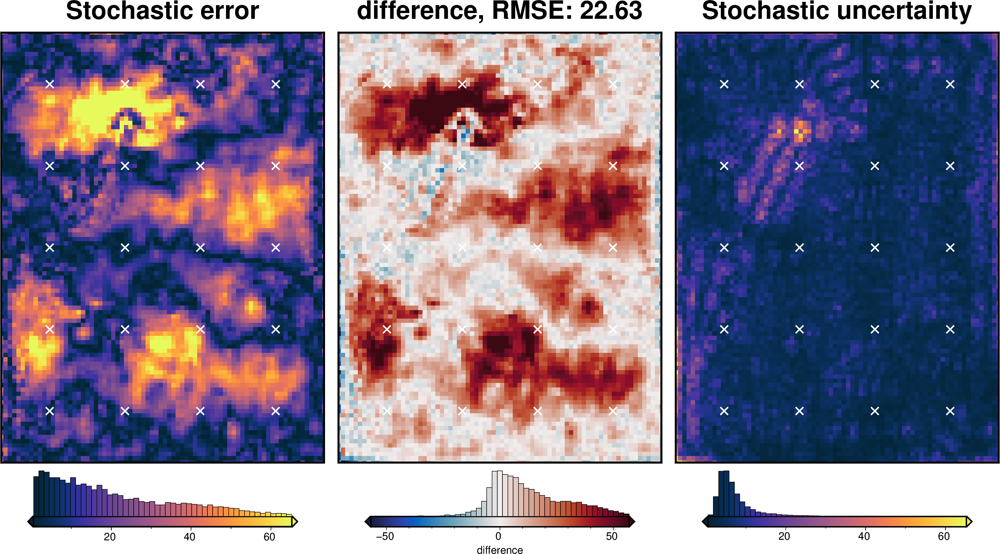

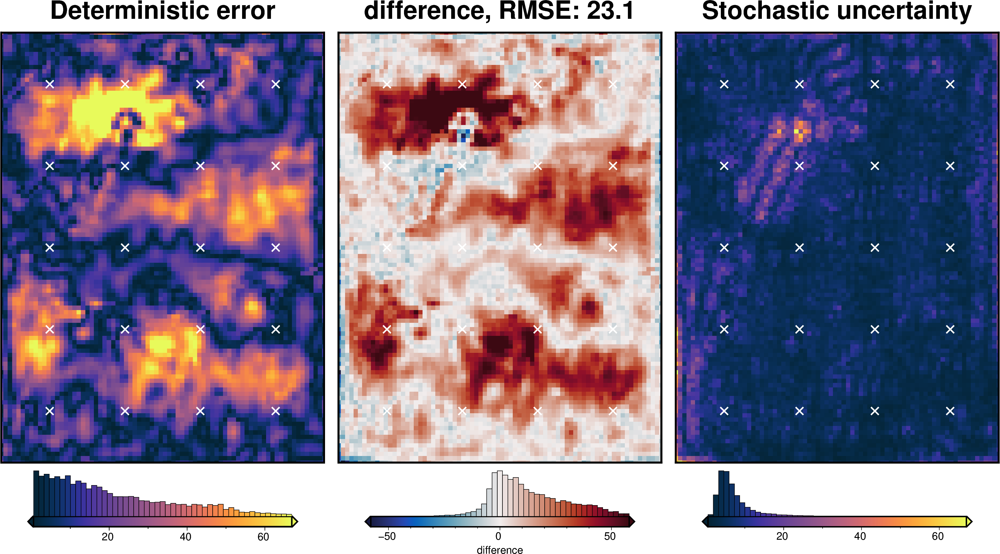

In [92]:
fname = "../../results/Ross_Sea_07_uncertainty_eq_sources"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_eq_sources_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=10,
    sample_gravity=True,
    **eqs_uncert_kwargs,
)

stats_ds = RIS_plotting.uncert_plots(
    uncert_eq_sources_results,
    # vd.pad_region(inversion_region, -3*spacing),
    inversion_region,
    spacing,
    bathymetry,
    deterministic_bathymetry=final_topography,
    constraint_points=constraint_points[constraint_points.inside],
    weight_by="constraints",
    # weight_by="residual",
    # weight_by=None,
)

## Total uncertainty
The total uncertainty includes uncertainty arising from several source. Below we list these and state how they are accounted for:
* solver damping value -> solver_dict
* density contrast value -> density_dict
* random errors in the constraint point depths -> not accounted for
* random errors in the gravity data -> point-by-point sampling of gravity data with constant estimated uncertainty value
* errors from interpolating flight lines into a grid -> standard deviation of equivalent source gridding ensemble used for point-by-point uncertainty
* errors from regional field estimation -> regional_misfit_parameter_dict

In [68]:
# make min gravity uncertainty the value used to contaminate the original grid
# grav_df_eqs["uncert_total"] = np.maximum(grav_df_eqs.uncert, gravity_noise)

# grav_df_eqs = regional.regional_separation(
#     grav_df=grav_df_eqs,
#     **new_regional_grav_kwargs,
# )

# kwargs to reuse for all uncertainty analyses
# eqs_uncert_kwargs = dict(
#     grav_df=grav_df_eqs,
#     density_contrast=best_density_contrast,
#     zref=zref,
#     starting_prisms=starting_prisms,
#     starting_topography=starting_bathymetry,
#     regional_grav_kwargs=new_regional_grav_kwargs,
#     **kwargs,
# )

In [63]:
# grav_grid = grav_df_eqs.set_index(["northing", "easting"]).to_xarray()

# maps.plot_grd(
#     grav_grid.uncert,
#     region=inversion_region,
#     fig_height=10,
#     title="Stochastic uncertainty",
#     cmap="thermal",
#     hist=True,
#     robust=True,
#     cbar_label="mGal",
# )

INFO:invert4geom:Sampled 'solver_damping' parameter values; mean: 0.014553698123021383, min: 0.007964496357172874, max: 0.024611115892741422
INFO:invert4geom:Sampled 'density_contrast' parameter values; mean: 1452.0, min: 1334.4021609275967, max: 1569.5978390724033
INFO:invert4geom:Sampled 'depth' parameter values; mean: 296659.4836532862, min: 199752.49971450452, max: 393566.4675920679
INFO:invert4geom:No pickle files starting with '../../results/Ross_Sea_07_uncertainty_full' found, creating new files



stochastic ensemble:   0%|          | 0/20 [00:00<?, ?it/s]

INFO:invert4geom:starting stochastic uncertainty analysis at run 0 of 20
saving results to pickle files with prefix: '../../results/Ross_Sea_07_uncertainty_full'



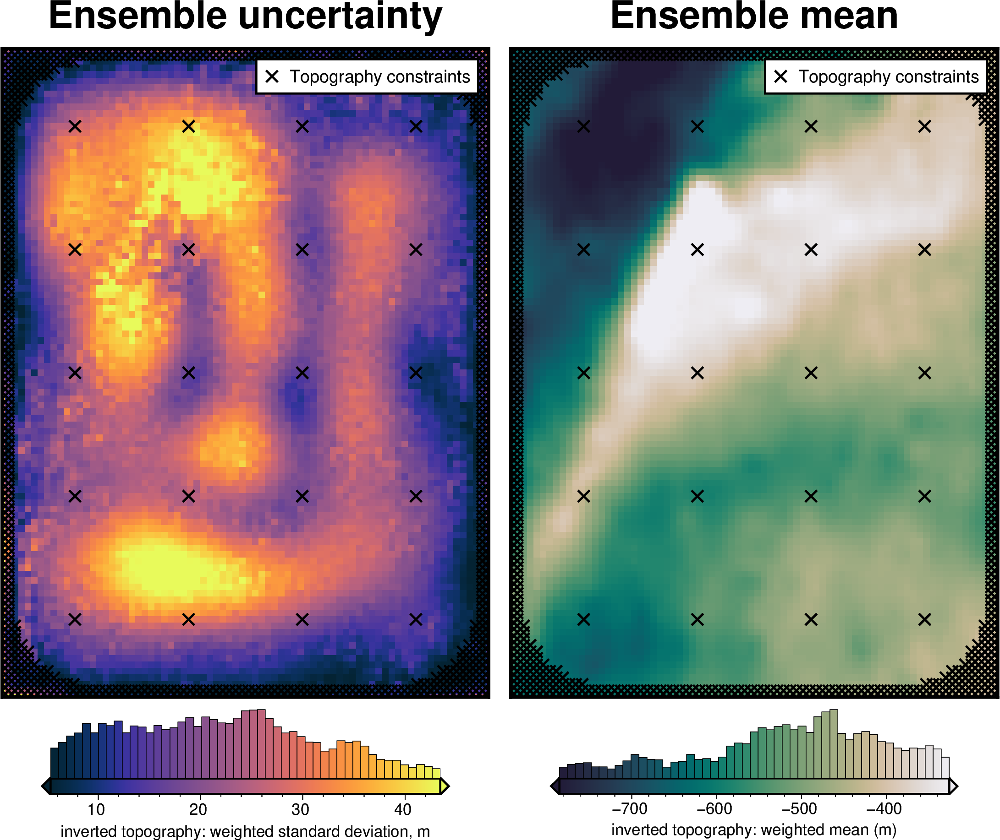

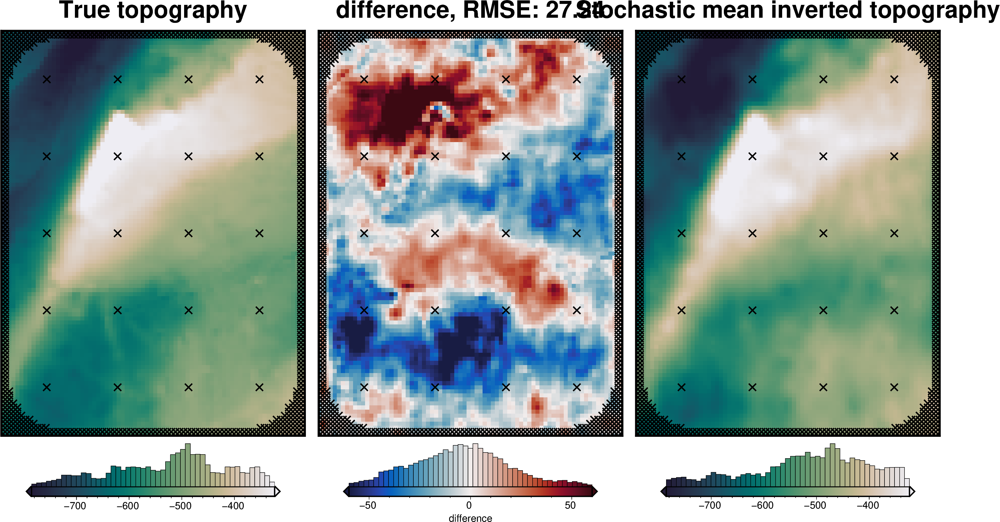

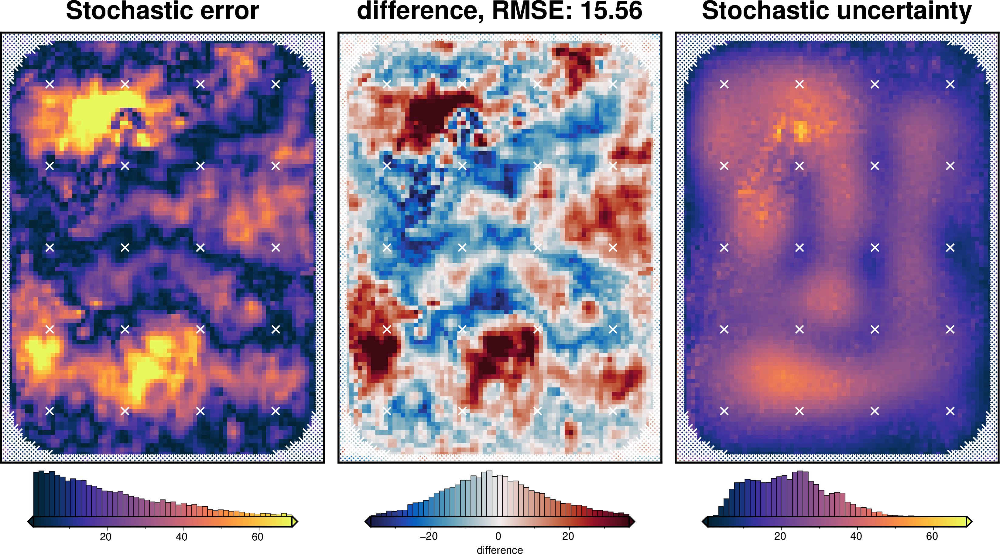

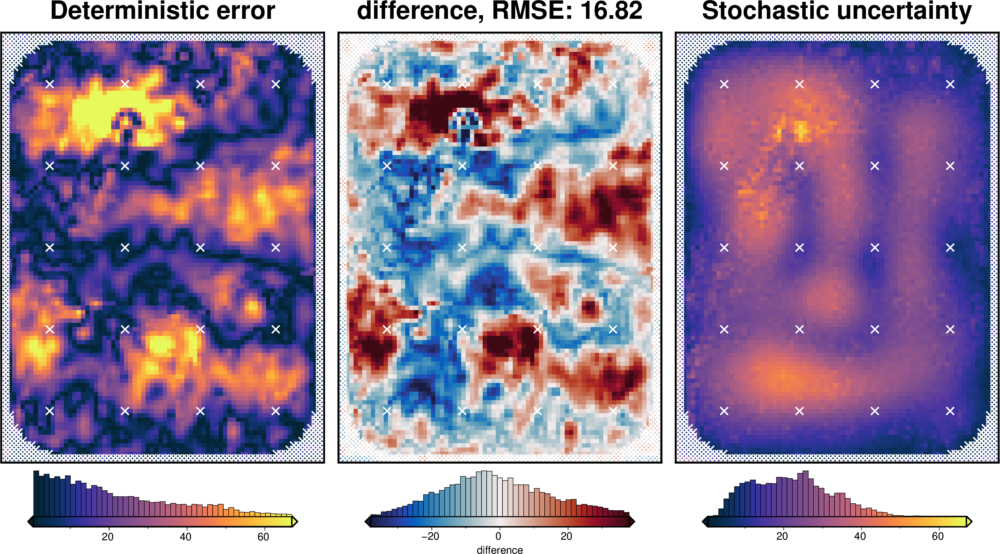

In [93]:
fname = "../../results/Ross_Sea_07_uncertainty_full"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=20,
    sample_gravity=True,
    sample_constraints=True,
    constraints_df=constraint_points,
    parameter_dict=solver_dict | density_dict,
    regional_misfit_parameter_dict=regional_misfit_parameter_dict,
    starting_topography_kwargs=starting_topography_kwargs,
    **eqs_uncert_kwargs,
)

stats_ds = RIS_plotting.uncert_plots(
    uncert_results,
    # vd.pad_region(inversion_region, -3*spacing),
    inversion_region,
    spacing,
    bathymetry,
    deterministic_bathymetry=final_topography,
    constraint_points=constraint_points,
    weight_by="constraints",
    # weight_by="residual",
    # weight_by=None,
)

### Comparing results

In [94]:
results = [
    uncert_results,
    uncert_eq_sources_results,
    uncert_regional_results,
    # uncert_grav_results,
    uncert_constraints_results,
    uncert_density_results,
    uncert_damping_results,
]
names = [
    "full",
    "eq_sources",
    "regional",
    # "grav",
    "constraints",
    "density",
    "damping",
]

# get cell-wise stats for each ensemble
stats = []
for r in results:
    ds = uncertainty.merged_stats(
        results=r,
        plot=False,
        constraints_df=constraint_points,
        weight_by="constraints",
        # region=vd.pad_region(inversion_region, -spacing),
        region=inversion_region,
    )
    stats.append(ds)

In [95]:
# get the standard deviation of the ensemble of ensembles
stdevs = []
for i, s in enumerate(stats):
    stdevs.append(s.weighted_stdev.rename(f"{names[i]}_stdev"))

merged = xr.merge(stdevs)
merged

<xarray.Dataset> Size: 370kB
Dimensions:            (northing: 101, easting: 76)
Coordinates:
  * northing           (northing) float64 808B -1.6e+06 -1.598e+06 ... -1.4e+06
  * easting            (easting) float64 608B -4e+04 -3.8e+04 ... 1.1e+05
Data variables:
    full_stdev         (northing, easting) float64 61kB 44.57 62.04 ... 31.62
    eq_sources_stdev   (northing, easting) float64 61kB 47.11 57.26 ... 34.75
    regional_stdev     (northing, easting) float64 61kB 18.12 10.24 ... 5.905
    constraints_stdev  (northing, easting) float64 61kB 9.097 4.803 ... 4.159
    density_stdev      (northing, easting) float64 61kB 1.057 1.372 ... 2.006
    damping_stdev      (northing, easting) float64 61kB 4.779 0.5379 ... 4.686

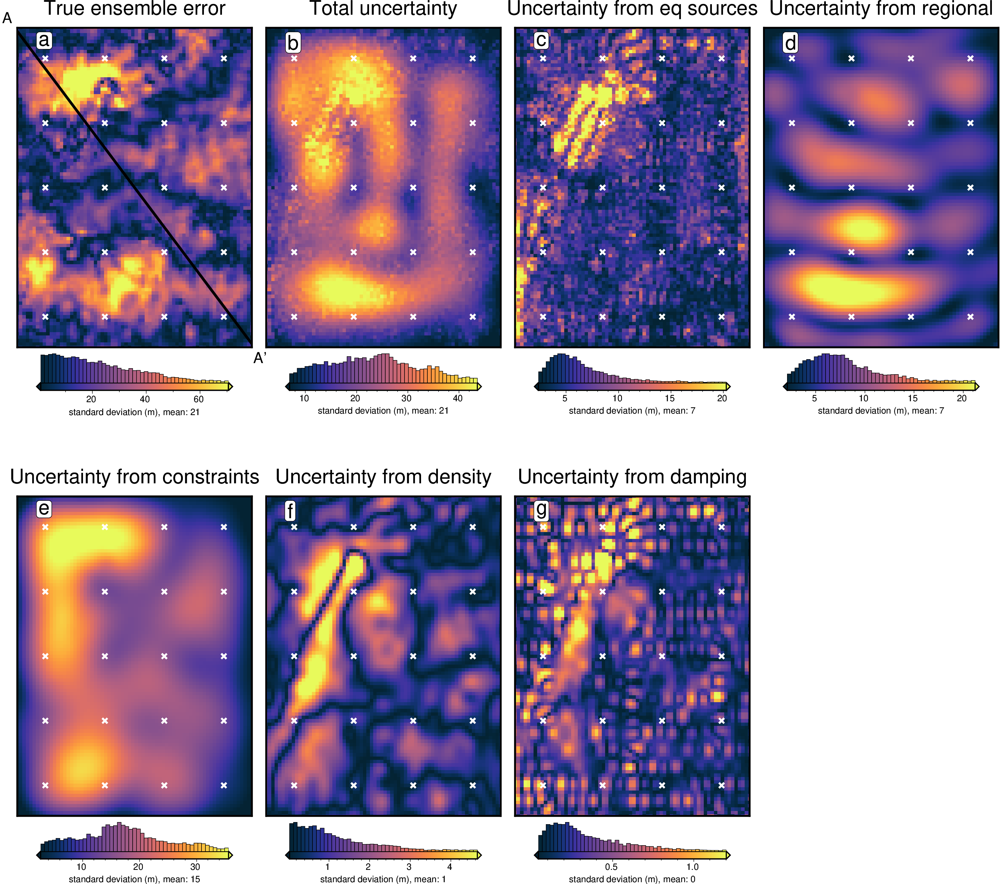

In [96]:
titles = [
    "True ensemble error",
    "Total uncertainty",
    "Uncertainty from eq sources",
    "Uncertainty from regional",
    # "Uncertainty from gravity",
    "Uncertainty from constraints",
    "Uncertainty from density",
    "Uncertainty from damping",
]
grids = list(merged.data_vars.values())

grids.insert(0, np.abs(stats[0].weighted_mean - bathymetry))

cpt_lims = polar_utils.get_min_max(
    grids[0],
    robust=True,
)
# cpt_lims = polar_utils.get_combined_min_max(grids, robust=True)

fig_height = 9
for i, g in enumerate(grids):
    xshift_amount = 1
    if i == 0:
        fig = None
        origin_shift = "initialize"
    elif i == 4:
        origin_shift = "both_shift"
        xshift_amount = -3
    else:
        origin_shift = "xshift"

    fig = maps.plot_grd(
        grid=g,
        fig_height=fig_height,
        region=vd.pad_region(inversion_region, -3 * spacing),
        title=titles[i],
        title_font="16p,Helvetica,black",
        cmap="thermal",
        # cpt_lims=cpt_lims,
        robust=True,
        cbar_label=f"standard deviation (m), mean: {int(np.nanmean(g))}",
        hist=True,
        hist_bin_num=50,
        cbar_yoffset=1,
        fig=fig,
        origin_shift=origin_shift,
        xshift_amount=xshift_amount,
        yshift_amount=-1.1,
    )
    fig.plot(
        x=constraint_points[constraint_points.inside].easting,
        y=constraint_points[constraint_points.inside].northing,
        style="x.2c",
        fill="white",
        pen="1.5p,white",
    )
    fig.text(
        position="TL",
        text=f"{string.ascii_lowercase[i]}",
        fill="white",
        pen=True,
        font="16p,Helvetica,black",
        offset="j.6/.2",
        clearance="+tO",
        no_clip=True,
    )
    if i == 0:
        # plot profiles location, and endpoints on map
        start = [inversion_region[0], inversion_region[3]]
        stop = [inversion_region[1], inversion_region[2]]
        fig.plot(
            vd.line_coordinates(start, stop, size=100),
            pen="2p,black",
        )
        fig.text(
            x=start[0],
            y=start[1],
            text="A",
            fill="white",
            font="12p,Helvetica,black",
            justify="CM",
            clearance="+tO",
            no_clip=True,
        )
        fig.text(
            x=stop[0],
            y=stop[1],
            text="A' ",
            fill="white",
            font="12p,Helvetica,black",
            justify="CM",
            clearance="+tO",
            no_clip=True,
        )
fig.show()

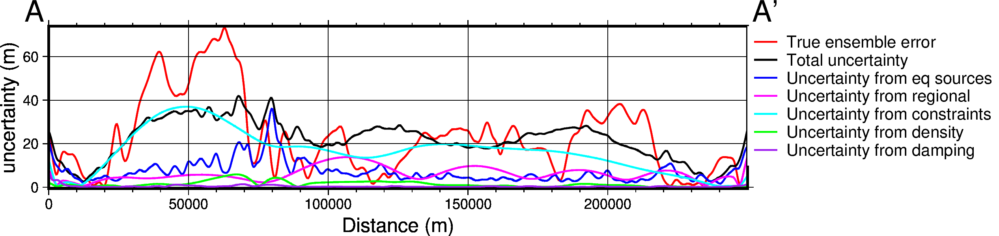

In [97]:
data_dict = profiles.make_data_dict(
    names=titles,
    grids=grids,
    colors=[
        "red",
        "black",
        "blue",
        "magenta",
        "cyan",
        "green",
        "purple",
        "gray",
    ],
)

fig, df_data = profiles.plot_data(
    "points",
    start=[inversion_region[0], inversion_region[3]],
    stop=[inversion_region[1], inversion_region[2]],
    num=10000,
    fig_height=4,
    fig_width=15,
    data_dict=data_dict,
    data_legend_loc="jTR+jTL",
    data_legend_box="+gwhite",
    data_buffer=0.01,
    data_frame=["neSW", "xafg+lDistance (m)", "yag+luncertainty (m)"],
    # data_pen_style=[None,None,"4_2:2p"],
    # data_pen_thickness=[1, 1.5, 1],
    share_yaxis=True,
    start_label="A",
    end_label="A' ",
)
fig.show()

In [98]:
# save results
merged.to_netcdf("../../results/Ross_Sea_07_sensitivity.nc")

In [99]:
stats_ds.to_netcdf("../../results/Ross_Sea_07_uncertainty.nc")